# 1. Import and define important functions

In [1]:
import os
import numpy as np


import nibabel as nib


import gudhi


import matplotlib.pyplot as plt

from tqdm import tqdm
from persim import plot_diagrams
from ripser import ripser, lower_star_img


data_folders = [
    "nifti/0/",
    "nifti/1/",
    "nifti/2/",
    "nifti/masks/"]

file_names = []
for df in data_folders:
    file_names.append(sorted(os.listdir(df)))

def find_extreme_values(i):
    min_value = 5000
    max_value = -5000
    j = 0
    df = data_folders[i]
    for fn in file_names[i]:
        j += 1
        file_path = os.path.join(df, fn)
        img_nifti = nib.load(file_path)
        img_np = np.array(img_nifti.dataobj)
        img_values = np.array(list(set(img_np.flatten())))
        img_min = img_values.min()
        img_max = img_values.max()
        min_value = min(min_value, img_min)
        max_value = max(max_value, img_max)
        if j % 10 == 0:
            print(j)

    print(min_value, max_value)


def find_border(image):
    values = np.array(list(set(image.flatten())))
    a, b = values.min(), values.max()
    print(a, b)
    return a, b

def img_read(file_path):
    img = nib.load(file_path)
    return np.array(img.dataobj).astype(int)

def my_rescale(image_old):
    image = image_old.copy()
    image[image > 1000] = 1000
    image[image < -1500] = -1500
    image = (image + 1500) / (1500 + 1000)
    return image


### 1.2 Examples

In [2]:
file_path = os.path.join(data_folders[0], file_names[0][0])

In [3]:
data_folders[0]

'nifti/0/'

In [4]:
file_names[0][0]

'study_0001.nii.gz'

In [5]:
import imageio

import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt
# img = cv.imread('gray/gray_0.jpg')
# gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)
# ret, thresh = cv.threshold(gray,0,255,cv.THRESH_BINARY_INV+cv.THRESH_OTSU)

In [6]:
file_path_00 = os.path.join(data_folders[0], file_names[0][0])
img_00_raw = img_read(file_path_00)
img_00 = my_rescale(img_00_raw)
print(img_00.shape)


(512, 512, 43)


In [7]:
type(img_00)

numpy.ndarray

In [8]:
img_00 = img_00.reshape([43, 512, 512])

In [9]:
def show_file(i, j=0, file_name=None):
    if file_name:
        file_path_00 = os.path.join(data_folders[i], file_name)
    else:
        file_path_00 = os.path.join(data_folders[i], file_names[i][j])
    img_00_raw = img_read(file_path_00)
    img_00 = my_rescale(img_00_raw)
    for i in range(img_00.shape[-1]):
        plt.figure(figsize=(10, 5))
        plt.subplot(121)
        plt.imshow(img_00_raw[:, :, i])
        plt.colorbar()
        minv, maxv = np.sort(list(set(img_00_raw[:, :, i].flatten())))[[0, -1]]
        plt.title('Slice #{} (from {} to {})'.format(i + 1, minv, maxv))
        plt.subplot(122)
        plt.imshow(img_00[:, :, i])
        plt.colorbar()
        plt.title('Slice #{} (from 0.0 to 1.0)'.format(i + 1))
        plt.show()
    return img_00

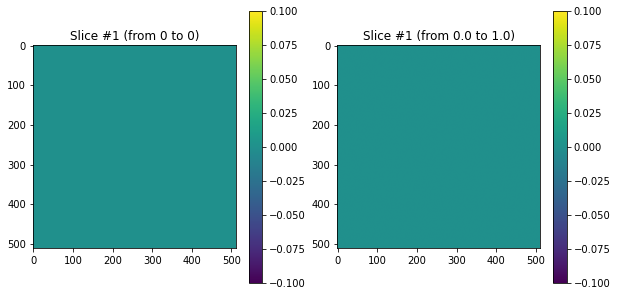

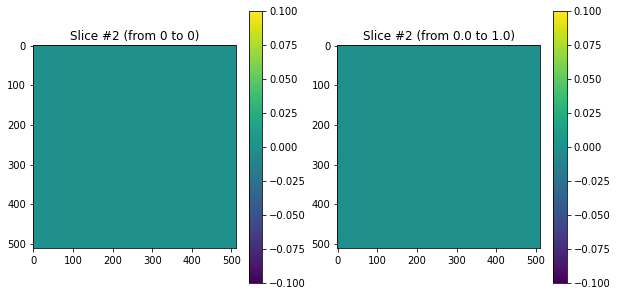

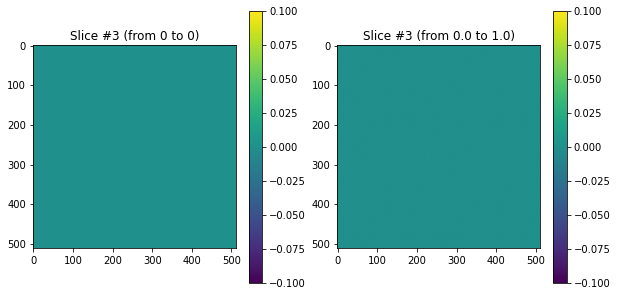

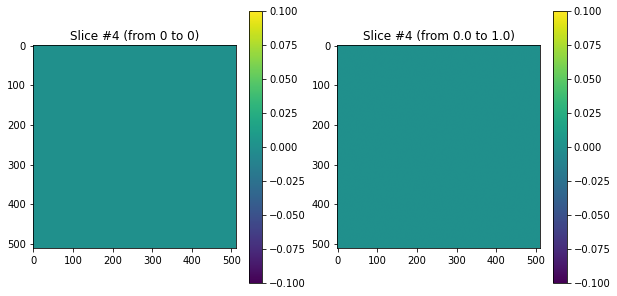

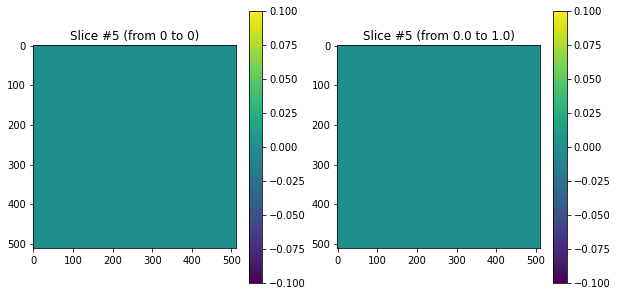

...

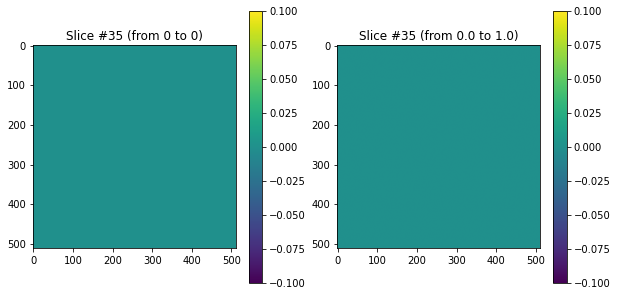

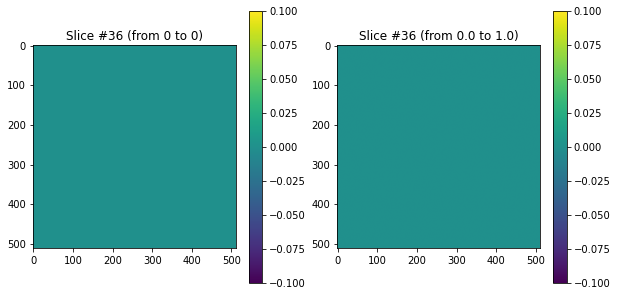

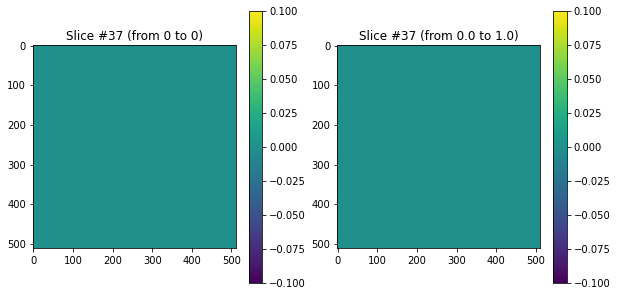

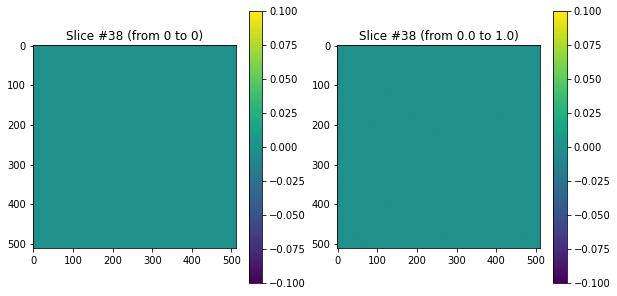

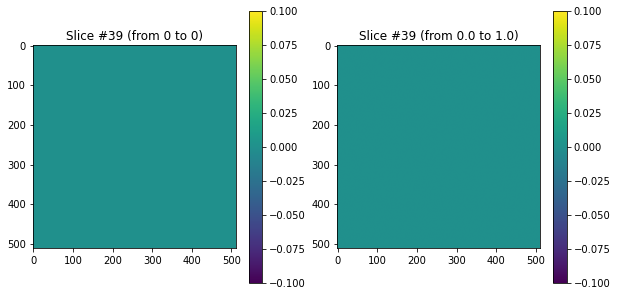

In [11]:
img_00 = show_file(3, 1)

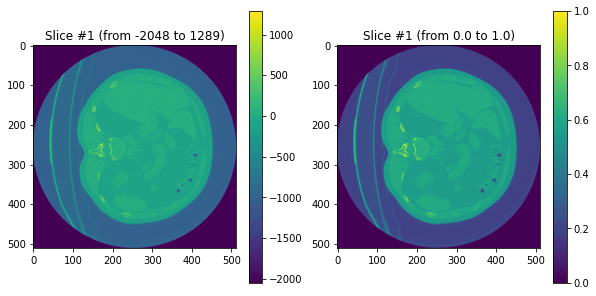

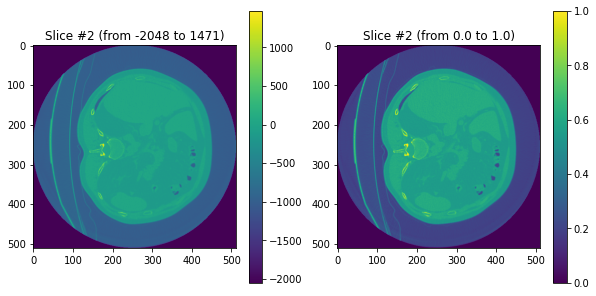

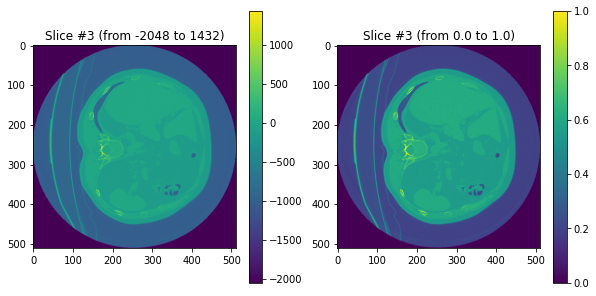

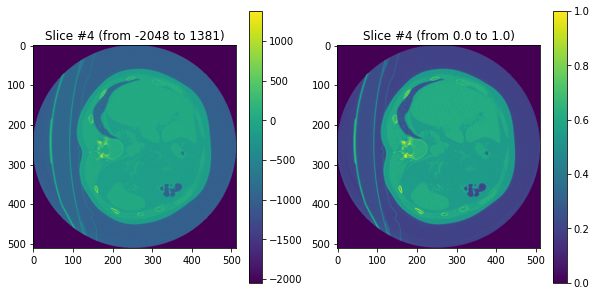

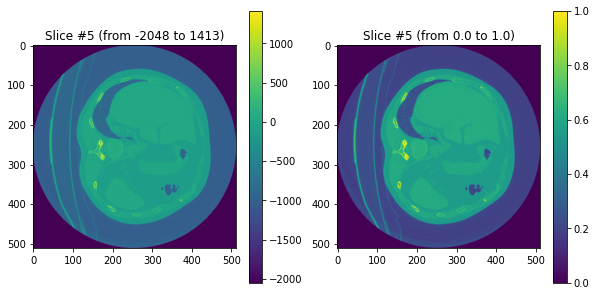

...

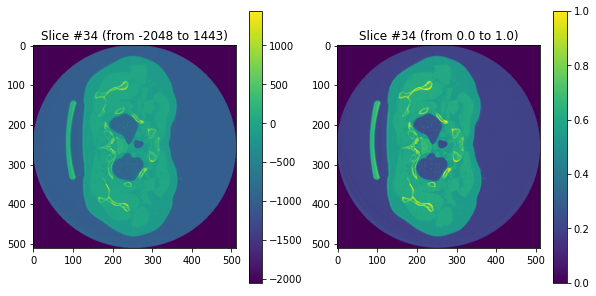

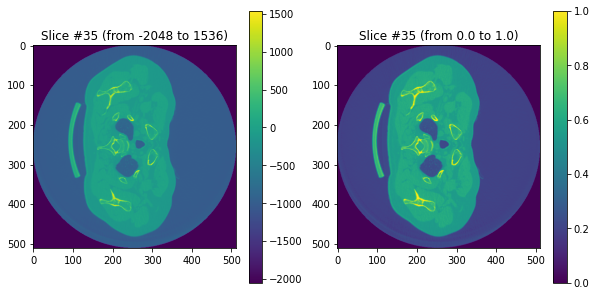

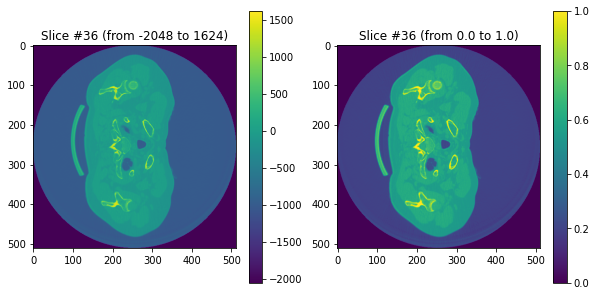

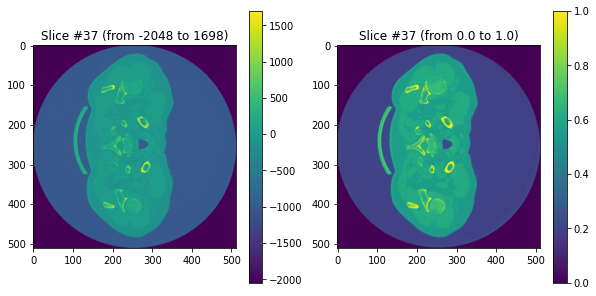

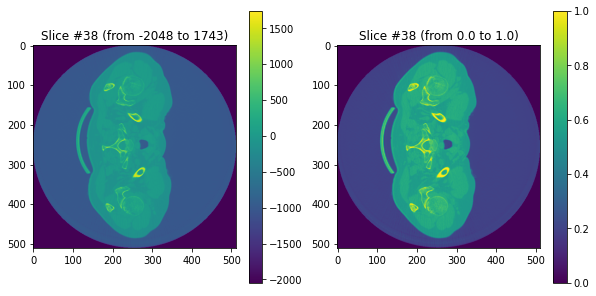

array([[[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       ...,

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0.

In [10]:
show_file(1, file_name='study_0255.nii.gz')

In [11]:
import torch
import numpy as np
from torch.utils.data import TensorDataset, DataLoader

my_x = [np.array([[1.0,2],[3,4]]),np.array([[5.,6],[7,8]])] # a list of numpy arrays
my_y = [np.array([4.]), np.array([2.])] # another list of numpy arrays (targets)

tensor_x = torch.Tensor(my_x) # transform to torch tensor
tensor_y = torch.Tensor(my_y)

my_dataset = TensorDataset(tensor_x,tensor_y) # create your datset
my_dataloader = DataLoader(my_dataset) # create your dataloader

In [12]:
from sklearn.model_selection import train_test_split
# train_test_split(np.arange(len(file_names[0])))

# 2. Start preprocessing

### 2.1 Extract LUNGS

In [13]:
import numpy as np # linear algebra
import pandas as pd # reading and processing of tables
import skimage, os
from skimage.morphology import convex_hull_image
from skimage.morphology import ball, disk, dilation, binary_erosion, remove_small_objects, erosion, closing, reconstruction, binary_closing
from skimage.measure import label,regionprops, perimeter
from skimage.morphology import binary_dilation, binary_opening
from skimage.filters import roberts, sobel
from skimage import measure, feature
from skimage.segmentation import clear_border
from skimage.util import montage as montage2d
from scipy import ndimage as ndi
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
# import dicom
import scipy.misc
CT_OFFSET = 1024
ZERO_VALUE = 0

In [49]:
def get_segmented_lungs(in_im, threshold=0.5, plot=False, convex_hull=False):
    im = in_im.copy() # don't change the input
    '''
    This funtion segments the lungs from the given 2D slice.
    '''
    if plot == True:
        f, plots = plt.subplots(3, 3, figsize=(10, 10))
        plots = plots.flatten()
    '''
    Step 1: Convert into a binary image. 
    '''
    binary = im < threshold
    if plot == True:
        plots[0].axis('off')
        plots[0].imshow(binary, cmap=plt.cm.bone) 
        plots[0].set_title('First Threshold')
    '''
    Step 2: Remove the blobs connected to the border of the image.
    '''
    cleared = clear_border(binary)
    if plot == True:
        plots[1].axis('off')
        plots[1].imshow(cleared, cmap=plt.cm.bone) 
        plots[1].set_title('Remove Border')
    '''
    Step 3: Label the image.
    '''
    label_image = label(cleared)
    if plot == True:
        plots[2].axis('off')
        plots[2].imshow(label_image, cmap=plt.cm.gist_earth)
        plots[2].set_title('Label Components')
    '''
    Step 4: Keep the labels with 2 largest areas.
    '''
    areas = [r.area for r in regionprops(label_image)]
    areas.sort()
    if len(areas) > 2:
        for region in regionprops(label_image):
            if region.area < areas[-2]:
                for coordinates in region.coords:                
                       label_image[coordinates[0], coordinates[1]] = 0
    binary = label_image > 0
    if plot == True:
        plots[3].axis('off')
        plots[3].imshow(binary, cmap=plt.cm.bone) 
        plots[3].set_title('Keep Biggest 2')
    '''
    Step 5: Erosion operation with a disk of radius 2. This operation is 
    seperate the lung nodules attached to the blood vessels.
    '''
    selem = disk(2)
    binary = binary_erosion(binary, selem)
    if plot == True:
        plots[4].axis('off')
        plots[4].imshow(binary, cmap=plt.cm.bone)
        plots[4].set_title('Erosion')
    '''
    Step 6: Closure operation with a disk of radius 10. This operation is 
    to keep nodules attached to the lung wall.
    '''
    selem = disk(10)
    binary = binary_closing(binary, selem)
    if plot == True:
        plots[5].axis('off')
        plots[5].imshow(binary, cmap=plt.cm.bone) 
        plots[5].set_title('Close Image')
    '''
    Step 7: Fill in the small holes inside the binary mask of lungs.
    '''
    edges = roberts(binary)
    binary = ndi.binary_fill_holes(edges)
    if plot == True:
        plots[6].axis('off')
        plots[6].imshow(binary, cmap=plt.cm.bone) 
        plots[6].set_title('Fill holes')
    '''
    Step 8: Superimpose the binary mask on the input image.
    '''
    if convex_hull:
        binary = convex_hull_image(binary)
    get_high_vals = (binary == 0)
    im[get_high_vals] = ZERO_VALUE # minimum value
    if plot == True:
        plots[7].axis('off')
        plots[7].imshow(im, cmap=plt.cm.bone) 
        plots[7].set_title('Binary Masked Input')
        
    return im

In [21]:
# def postprocess(x):
#     x = x.copy()
#     new_arr = x / np.percentile(x, 99)
#     new_arr[new_arr > 1] = 1
#     new_arr = 1 - (1 / (1 - np.percentile(new_arr, 1))) * (1 - new_arr)
#     return new_arr

In [38]:
file_path_00 = os.path.join(data_folders[2], file_names[2][1])
img_00_raw = img_read(file_path_00)
img_00 = my_rescale(img_00_raw)

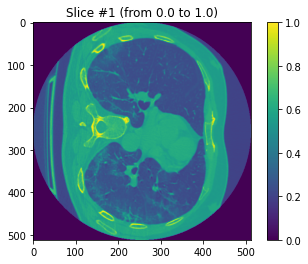

In [39]:
plt.imshow(img_00[:, :, 22])
plt.colorbar()
plt.title('Slice #{} (from 0.0 to 1.0)'.format(0 + 1))
plt.show()

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

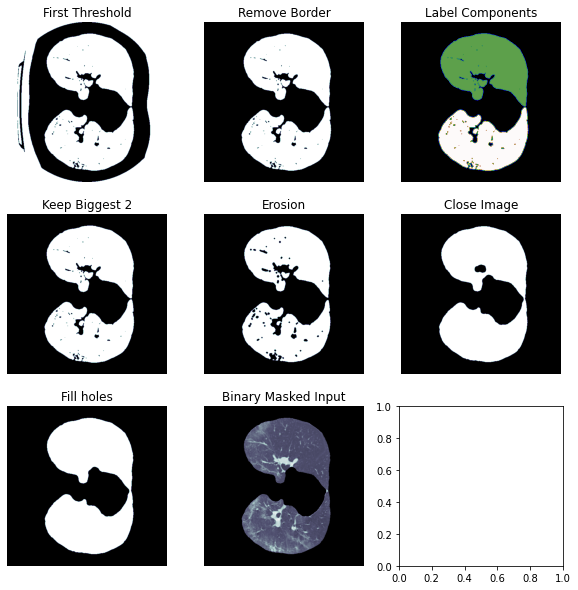

In [50]:
get_segmented_lungs(img_00[:, :, 22], plot=True)

#### 2.1.2 With convex hull

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

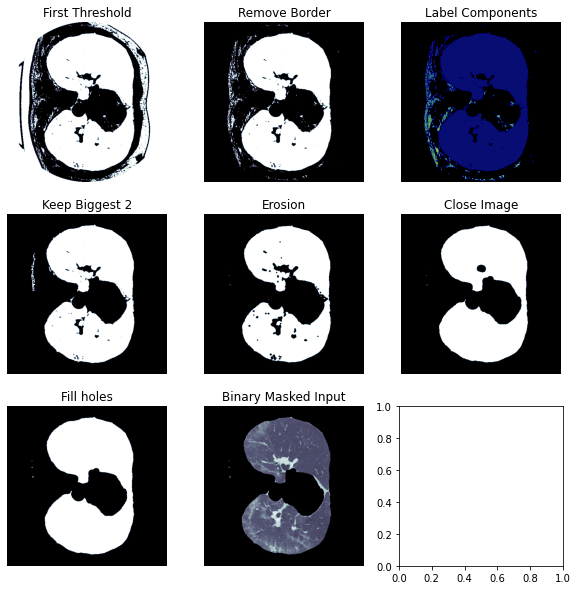

In [26]:
get_segmented_lungs(x, plot=True, convex_hull=False)

#### 2.1.3 Without convex hull

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

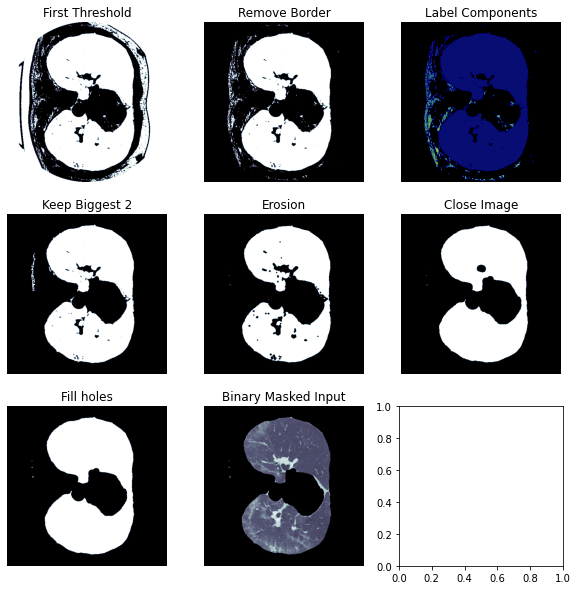

In [27]:
get_segmented_lungs(x, plot=True)

### 2.2 Convert niftis to slices

#### TEMP FOR MASKS

In [19]:
from PIL import Image
import cv2

In [20]:
from tqdm import tqdm
from PIL import Image
from sklearn.model_selection import train_test_split
for j in tqdm(range(200)):
    prefix_img='imgs'
    prefix_msk='masks'
    file_path_img = os.path.join(data_folders[1], file_names[1][j])
    file_path_mask = os.path.join(data_folders[3], file_names[3][j])
    img = my_rescale(img_read(file_path_img))
    mask = my_rescale(img_read(file_path_mask))
    for t in np.arange(2, img.shape[2] - 3):
        I = get_segmented_lungs(postprocess(img[:, :, t]))
        I_mask = mask[:, :, t]
        if np.max(I_mask) > 0.5:
            I8 = (((I - I.min()) / (I.max() - I.min())) * 255.9).astype(np.uint8)
            imgsaved = Image.fromarray(I8)
            imgsaved.save("datamasks/{}/img_{}_{}.png".format(prefix_img, j, t))
            I8 = (((I_mask - I_mask.min()) / (I_mask.max() - I_mask.min())) * 255.9).astype(np.uint8)
            masksaved = Image.fromarray(I8)
            masksaved.save("datamasks/{}/img_{}_{}.png".format(prefix_msk, j, t))

100%|██████████| 50/50 [05:52<00:00,  7.04s/it]


In [88]:
file_path_img = 'datamasks/imgs/img_{}_{}.png'.format(1, 1)
file_path_mask = 'datamasks/masks/img_{}_{}.png'.format(1, 1)
plt.figure(figsize=(15, 10))
im = cv2.imread(file_path_img, cv2.IMREAD_GRAYSCALE)

<Figure size 1080x720 with 0 Axes>

In [32]:
import cv2
def show_masks_overlayed(j):
    shape = img_read(os.path.join(data_folders[1], file_names[1][j])).shape
    img = my_rescale(img_read(os.path.join(data_folders[1], file_names[1][j])))
    for t in np.arange(2, shape[2] - 3):
        file_path_img = 'datamasks/imgs/img_{}_{}.png'.format(j, t)
        file_path_mask = 'datamasks/masks/img_{}_{}.png'.format(j, t)
        
        im = cv2.imread(file_path_img, cv2.IMREAD_GRAYSCALE)
        if type(im) == type(None):
            continue
        plt.figure(figsize=(15, 10))
        masked = cv2.imread(file_path_mask, cv2.IMREAD_GRAYSCALE)
        plt.subplot(131)
        plt.imshow(im, 'gray', interpolation='none')
        plt.subplot(132)
        plt.imshow(im, 'gray', interpolation='none')
        plt.imshow(masked, 'jet', interpolation='none', alpha=0.1)
        plt.subplot(133)
        masked_lung = np.array(im > 0)
        plt.imshow(img[:,:,t], 'gray', interpolation='none')
#         plt.imshow(masked_lung, 'jet', interpolation='none')

<ipython-input-31-07dfd75f260a>:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15, 10))


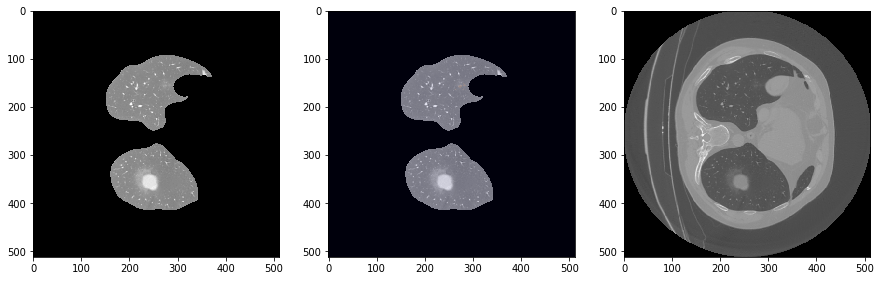

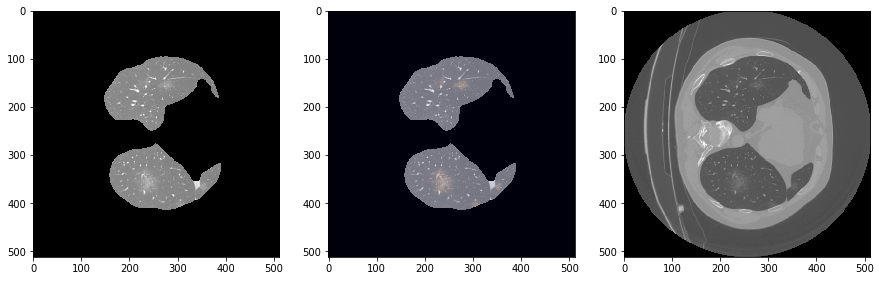

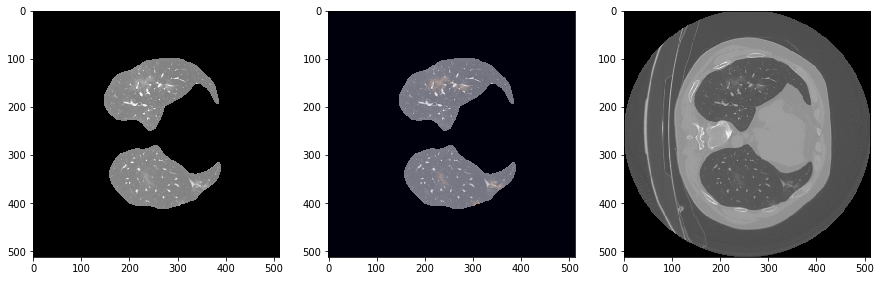

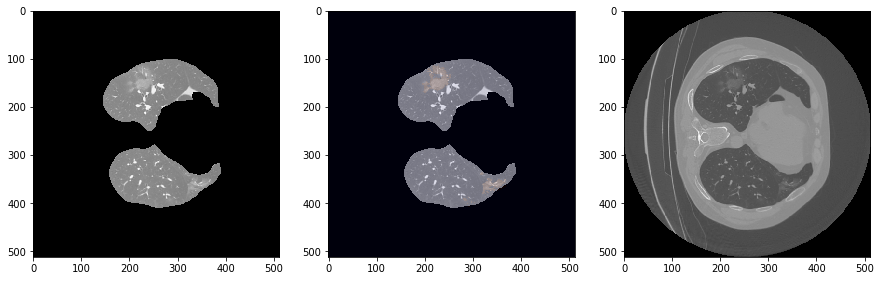

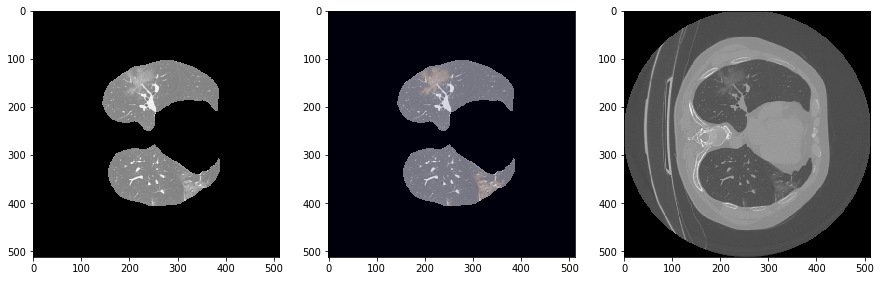

...

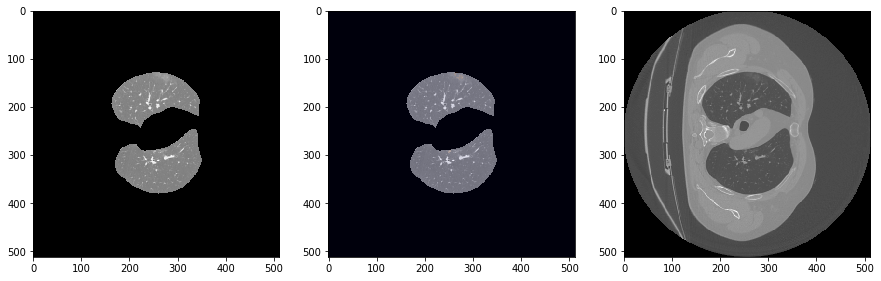

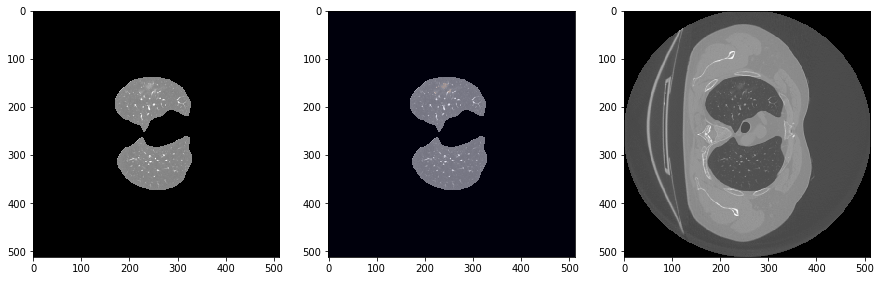

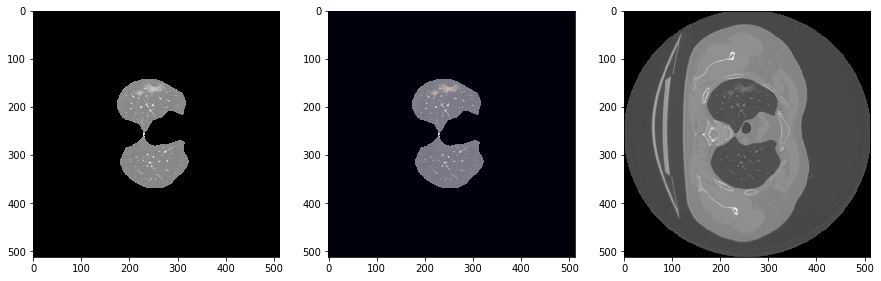

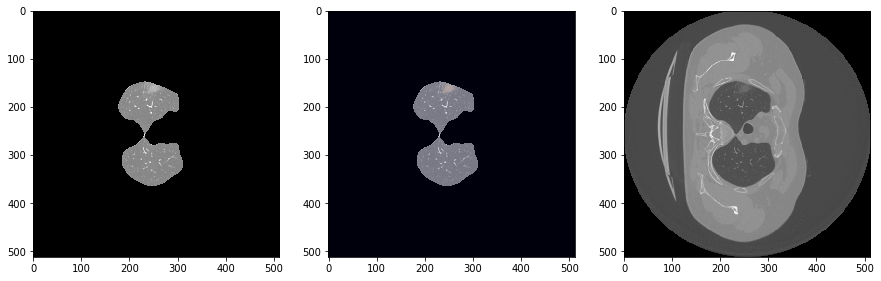

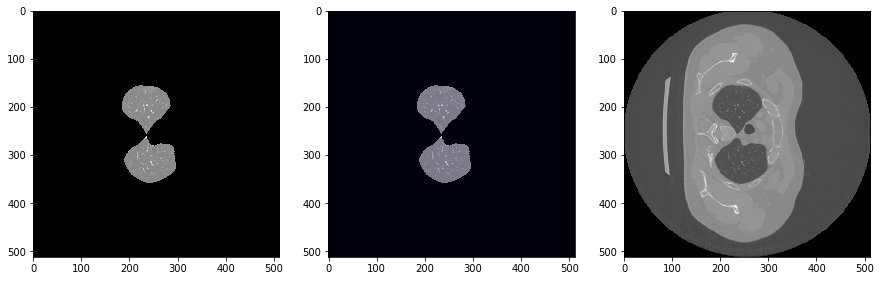

In [32]:
show_masks_overlayed(0)

## MAKE PNGs FROM NIFTIs

In [51]:
# class 2
from tqdm import tqdm
from PIL import Image
from sklearn.model_selection import train_test_split
for j in tqdm(range(len(file_names[2]))):
    file_path_img = os.path.join(data_folders[2], file_names[2][j])
    img = my_rescale(img_read(file_path_img))
    for t in np.arange(2, img.shape[2] - 3):
        I = get_segmented_lungs(img[:, :, t])
        I8 = (((I - I.min()) / (I.max() - I.min())) * 255.9).astype(np.uint8)
        imgsaved = Image.fromarray(I8)
        imgsaved.save("data/2/{}_{}.png".format(file_names[2][j].split('.')[0], t))

  2%|▏         | 3/172 [00:17<15:15,  5.42s/it]<ipython-input-51-46991c4a01f2>:10: RuntimeWarning: invalid value encountered in true_divide
  I8 = (((I - I.min()) / (I.max() - I.min())) * 255.9).astype(np.uint8)
100%|██████████| 172/172 [14:08<00:00,  4.93s/it]


In [52]:
# class 1
from tqdm import tqdm
from PIL import Image
from sklearn.model_selection import train_test_split
for j in tqdm(range(len(file_names[1]))):
    file_path_img = os.path.join(data_folders[1], file_names[1][j])
    img = my_rescale(img_read(file_path_img))
    for t in np.arange(2, img.shape[2] - 3):
        I = get_segmented_lungs(img[:, :, t])
        I8 = (((I - I.min()) / (I.max() - I.min())) * 255.9).astype(np.uint8)
        imgsaved = Image.fromarray(I8)
        imgsaved.save("data/1/{}_{}.png".format(file_names[1][j].split('.')[0], t))

  1%|          | 5/684 [00:23<53:05,  4.69s/it]<ipython-input-52-288ab80e1476>:10: RuntimeWarning: invalid value encountered in true_divide
  I8 = (((I - I.min()) / (I.max() - I.min())) * 255.9).astype(np.uint8)
100%|██████████| 684/684 [53:49<00:00,  4.72s/it]


In [53]:
# class 0
from tqdm import tqdm
from PIL import Image
from sklearn.model_selection import train_test_split
for j in tqdm(range(len(file_names[0]))):
    prefix_img='imgs'
    file_path_img = os.path.join(data_folders[0], file_names[0][j])
    img = my_rescale(img_read(file_path_img))
    for t in np.arange(2, img.shape[2] - 3):
        I = get_segmented_lungs(img[:, :, t])
        I8 = (((I - I.min()) / (I.max() - I.min())) * 255.9).astype(np.uint8)
        imgsaved = Image.fromarray(I8)
        imgsaved.save("data/0/{}_{}.png".format(file_names[0][j].split('.')[0], t))

 21%|██        | 53/254 [04:44<18:13,  5.44s/it]<ipython-input-53-856eb6894906>:11: RuntimeWarning: invalid value encountered in true_divide
  I8 = (((I - I.min()) / (I.max() - I.min())) * 255.9).astype(np.uint8)
100%|██████████| 254/254 [21:08<00:00,  4.99s/it]


In [35]:
img.shape

(512, 512, 42)

<ipython-input-54-8ee4f2350144>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


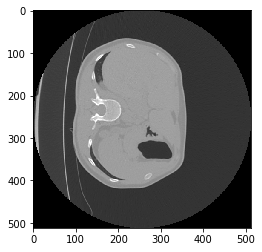

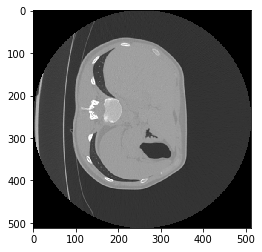

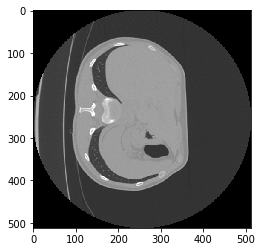

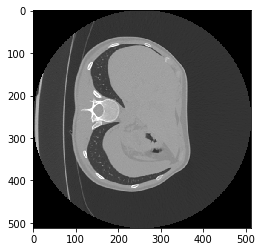

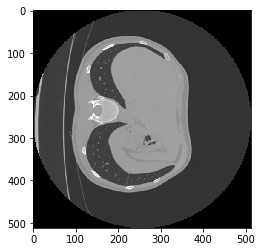

...

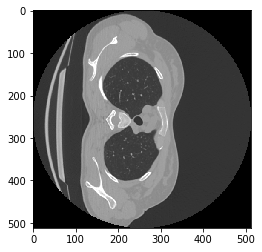

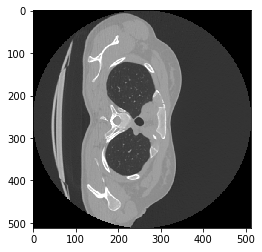

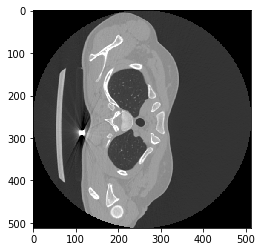

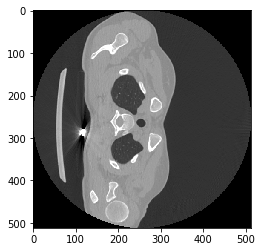

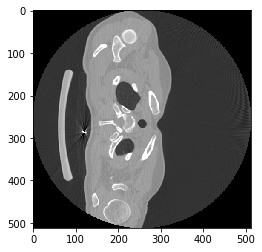

In [54]:
prefix_img='imgs'
file_path_img = os.path.join(data_folders[0], file_names[0][100])
img = my_rescale(img_read(file_path_img))
for t in np.arange(2, img.shape[2] - 3):
    I = img[:, :, t]
    plt.figure()
    plt.imshow(I, 'gray', interpolation='none')

# PATHOLOGY MASK THRESHOLDING

(array([2.61844e+05, 0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        1.98000e+02, 5.60000e+01, 1.90000e+01, 1.30000e+01, 1.40000e+01]),
 array([0.        , 0.06971871, 0.13943742, 0.20915613, 0.27887483,
        0.34859354, 0.41831225, 0.48803096, 0.55774967, 0.62746838,
        0.69718709]),
 <BarContainer object of 10 artists>)

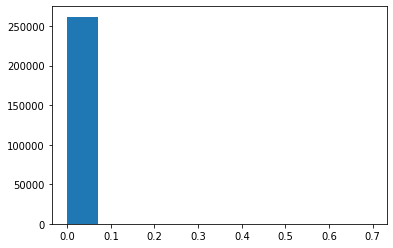

In [105]:
I = get_segmented_lungs(postprocess(img[:, :, t]))
plt.hist(I.flatten(), bins=10)

<class 'numpy.ndarray'>


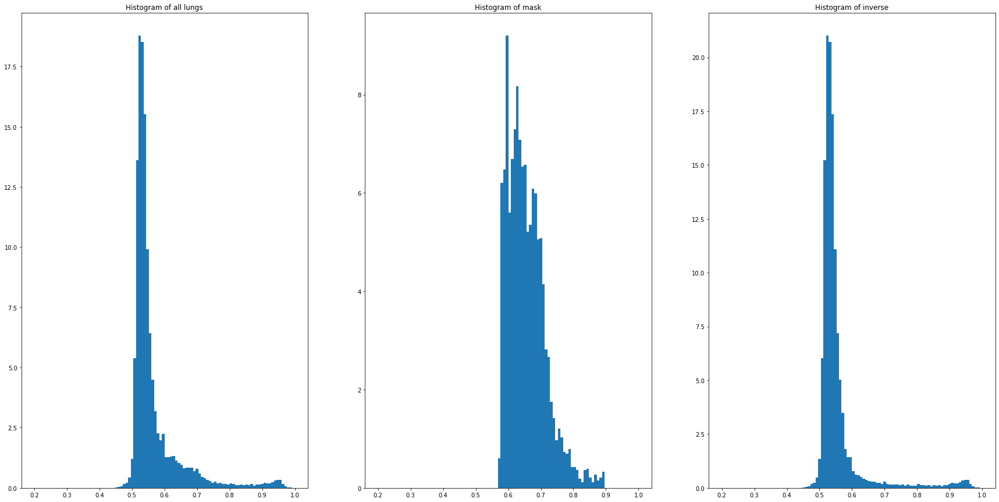

In [121]:
j = 0
t = 15
file_path_img = 'datamasks/imgs/img_{}_{}.png'.format(j, t)
file_path_mask = 'datamasks/masks/img_{}_{}.png'.format(j, t)
im = cv2.imread(file_path_img, cv2.IMREAD_GRAYSCALE)
print(type(im))
im = np.true_divide(im, 255)
if type(im) == type(None):
    raise ValueError
plt.figure(figsize=(30, 15))
masked = cv2.imread(file_path_mask, cv2.IMREAD_GRAYSCALE)
masked = np.true_divide(masked, 255)
plt.subplot(131)
plt.title('Histogram of all lungs')
common = plt.hist(im.flatten(), range = (0.2, 1), density=True, bins=100)
plt.subplot(132)
plt.title('Histogram of mask')
mask_hist = plt.hist(np.multiply(im, masked).flatten(), range = (0.2, 1), density=True, bins=100)
plt.subplot(133)
plt.title('Histogram of inverse')
inv_hist = plt.hist(np.multiply(im, (1 - masked)).flatten(), range = (0.2, 1), density=True, bins=100)

### Gridsearch thresholds

In [141]:
lows = np.arange(0.565, 0.57, 0.001)
highs = np.arange(0.79, 0.8, 0.001)

In [138]:
from tqdm import tqdm
def calculate_dice_low_high(low, high):
    mean_dice = 0
    dices = []
    for j in tqdm(range(50)):
        shape = img_read(os.path.join(data_folders[1], file_names[1][j])).shape
        img = my_rescale(img_read(os.path.join(data_folders[1], file_names[1][j])))
        for t in np.arange(2, shape[2] - 3):
            file_path_img = 'datamasks/imgs/img_{}_{}.png'.format(j, t)
            file_path_mask = 'datamasks/masks/img_{}_{}.png'.format(j, t)
            im = cv2.imread(file_path_img, cv2.IMREAD_GRAYSCALE)    
            if type(im) == type(None):
                continue
            im = np.true_divide(im, 255)
            masked = cv2.imread(file_path_mask, cv2.IMREAD_GRAYSCALE)
            masked = np.true_divide(masked, 255)
            im = np.multiply((im > low), (im < high))
            inter = np.dot(im.flatten(), masked.flatten())
            union = np.sum(im.flatten()) + np.sum(masked.flatten()) + 0.001
            t = (2 * inter + 0.001) / union
            dices.append(t)
    return np.mean(dices), dices
mean, dices = calculate_dice(0.565, 0.8)
mean

100%|██████████| 50/50 [01:12<00:00,  1.45s/it]


0.18629048848120405

In [143]:
best_mean = 0
best_low = lows[0]
best_high = highs[0]
best_dices = []
for low in lows:
    for high in highs:
        mean, dices = calculate_dice_low_high(low, high)
        if mean > best_mean:
            best_mean = mean
            best_low = low
            best_high = high
            best_dices = dices
        print("LOW, HIGH : {}, {} ; DICE {}".format(low, high, mean))

  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.565, 0.79 ; DICE 0.18569960627556054


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.565, 0.791 ; DICE 0.18569960627556054


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.565, 0.792 ; DICE 0.18569960627556054


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.565, 0.793 ; DICE 0.18601488662591686


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.565, 0.794 ; DICE 0.18601488662591686


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.565, 0.795 ; DICE 0.18601488662591686


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.565, 0.796 ; DICE 0.18601488662591686


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.565, 0.797 ; DICE 0.18629048848120405


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.565, 0.798 ; DICE 0.18629048848120405


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.565, 0.799 ; DICE 0.18629048848120405


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.565, 0.8 ; DICE 0.18629048848120405


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.566, 0.79 ; DICE 0.18569960627556054


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.566, 0.791 ; DICE 0.18569960627556054


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.566, 0.792 ; DICE 0.18569960627556054


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.566, 0.793 ; DICE 0.18601488662591686


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.566, 0.794 ; DICE 0.18601488662591686


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.566, 0.795 ; DICE 0.18601488662591686


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.566, 0.796 ; DICE 0.18601488662591686


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.566, 0.797 ; DICE 0.18629048848120405


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.566, 0.798 ; DICE 0.18629048848120405


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.566, 0.799 ; DICE 0.18629048848120405


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.566, 0.8 ; DICE 0.18629048848120405


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.567, 0.79 ; DICE 0.18569960627556054


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.567, 0.791 ; DICE 0.18569960627556054


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.567, 0.792 ; DICE 0.18569960627556054


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.567, 0.793 ; DICE 0.18601488662591686


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.567, 0.794 ; DICE 0.18601488662591686


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.567, 0.795 ; DICE 0.18601488662591686


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.567, 0.796 ; DICE 0.18601488662591686


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.567, 0.797 ; DICE 0.18629048848120405


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.567, 0.798 ; DICE 0.18629048848120405


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.567, 0.799 ; DICE 0.18629048848120405


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.567, 0.8 ; DICE 0.18629048848120405


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.568, 0.79 ; DICE 0.18569960627556054


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.568, 0.791 ; DICE 0.18569960627556054


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.568, 0.792 ; DICE 0.18569960627556054


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.568, 0.793 ; DICE 0.18601488662591686


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.568, 0.794 ; DICE 0.18601488662591686


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.568, 0.795 ; DICE 0.18601488662591686


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.568, 0.796 ; DICE 0.18601488662591686


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.568, 0.797 ; DICE 0.18629048848120405


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.568, 0.798 ; DICE 0.18629048848120405


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.568, 0.799 ; DICE 0.18629048848120405


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.568, 0.8 ; DICE 0.18629048848120405


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.569, 0.79 ; DICE 0.19583682095500782


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.569, 0.791 ; DICE 0.19583682095500782


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.569, 0.792 ; DICE 0.19583682095500782


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.569, 0.793 ; DICE 0.19614783976024625


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.569, 0.794 ; DICE 0.19614783976024625


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.569, 0.795 ; DICE 0.19614783976024625


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.569, 0.796 ; DICE 0.19614783976024625


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.569, 0.797 ; DICE 0.19641660632449773


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.569, 0.798 ; DICE 0.19641660632449773


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.569, 0.799 ; DICE 0.19641660632449773


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.569, 0.8 ; DICE 0.19641660632449773


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.57, 0.79 ; DICE 0.19583682095500782


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.57, 0.791 ; DICE 0.19583682095500782


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.57, 0.792 ; DICE 0.19583682095500782


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.57, 0.793 ; DICE 0.19614783976024625


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.57, 0.794 ; DICE 0.19614783976024625


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.57, 0.795 ; DICE 0.19614783976024625


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.57, 0.796 ; DICE 0.19614783976024625


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.57, 0.797 ; DICE 0.19641660632449773


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.57, 0.798 ; DICE 0.19641660632449773


  0%|          | 0/50 [00:00<?, ?it/s]

LOW, HIGH : 0.57, 0.799 ; DICE 0.19641660632449773


100%|██████████| 50/50 [01:09<00:00,  1.39s/it]

LOW, HIGH : 0.57, 0.8 ; DICE 0.19641660632449773


In [145]:
from skimage.filters import gaussian

In [151]:
low = best_low
high = best_high
def calculate_dice_filter(hambda, thresh):
    mean_dice = 0
    dices = []
    for j in tqdm(range(50)):
        shape = img_read(os.path.join(data_folders[1], file_names[1][j])).shape
        img = my_rescale(img_read(os.path.join(data_folders[1], file_names[1][j])))
        for t in np.arange(2, shape[2] - 3):
            file_path_img = 'datamasks/imgs/img_{}_{}.png'.format(j, t)
            file_path_mask = 'datamasks/masks/img_{}_{}.png'.format(j, t)
            im = cv2.imread(file_path_img, cv2.IMREAD_GRAYSCALE)    
            if type(im) == type(None):
                continue
            im = np.true_divide(im, 255)
            masked = cv2.imread(file_path_mask, cv2.IMREAD_GRAYSCALE)
            masked = np.true_divide(masked, 255)
            im = np.multiply((im > low), (im < high))
            im = gaussian(im, sigma=hambda)
            im = im > thresh
            inter = np.dot(im.flatten(), masked.flatten())
            union = np.sum(im.flatten()) + np.sum(masked.flatten()) + 0.001
            t = (2 * inter + 0.001) / union
            dices.append(t)
    return np.mean(dices), dices

In [147]:
mean, dices = calculate_dice_filter(1, 0.5)

100%|██████████| 50/50 [01:18<00:00,  1.57s/it]


In [152]:
hambdas = [0.1, 0.25, 0.5, 1, 2, 3, 4, 5]
threshes = [0.3, 0.4, 0.5, 0.6]
best_hambda = hambdas[0]
best_thresh = threshes[0]
best_mean = 0
for hambda in hambdas:
    for thresh in threshes:
        mean, dices = calculate_dice_filter(hambda, thresh)
        print("Hambda : {}, thresh : {},  mean: {}".format(mean, thresh,  hambda))
        if mean > best_mean:
            best_mean = mean
            best_hambda = hambda
            best_thresh = thresh

  0%|          | 0/50 [00:00<?, ?it/s]

Hambda : 0.19641660632449773, thresh : 0.3,  mean: 0.1


  0%|          | 0/50 [00:00<?, ?it/s]

Hambda : 0.19641660632449773, thresh : 0.4,  mean: 0.1


  0%|          | 0/50 [00:00<?, ?it/s]

Hambda : 0.19641660632449773, thresh : 0.5,  mean: 0.1


  0%|          | 0/50 [00:00<?, ?it/s]

Hambda : 0.19641660632449773, thresh : 0.6,  mean: 0.1


  0%|          | 0/50 [00:00<?, ?it/s]

Hambda : 0.19641660632449773, thresh : 0.3,  mean: 0.25


  0%|          | 0/50 [00:00<?, ?it/s]

Hambda : 0.19641660632449773, thresh : 0.4,  mean: 0.25


  0%|          | 0/50 [00:00<?, ?it/s]

Hambda : 0.19641660632449773, thresh : 0.5,  mean: 0.25


  0%|          | 0/50 [00:00<?, ?it/s]

Hambda : 0.19641660632449773, thresh : 0.6,  mean: 0.25


  0%|          | 0/50 [00:00<?, ?it/s]

Hambda : 0.19626676907467386, thresh : 0.3,  mean: 0.5


  0%|          | 0/50 [00:00<?, ?it/s]

Hambda : 0.19641660632449773, thresh : 0.4,  mean: 0.5


  0%|          | 0/50 [00:00<?, ?it/s]

Hambda : 0.19641660632449773, thresh : 0.5,  mean: 0.5


  0%|          | 0/50 [00:00<?, ?it/s]

Hambda : 0.19641660632449773, thresh : 0.6,  mean: 0.5


  0%|          | 0/50 [00:00<?, ?it/s]

Hambda : 0.17713289452816602, thresh : 0.3,  mean: 1


  0%|          | 0/50 [00:00<?, ?it/s]

Hambda : 0.20072173596680487, thresh : 0.4,  mean: 1


  0%|          | 0/50 [00:00<?, ?it/s]

Hambda : 0.22643975786060844, thresh : 0.5,  mean: 1


  0%|          | 0/50 [00:00<?, ?it/s]

Hambda : 0.26154079744828695, thresh : 0.6,  mean: 1


  0%|          | 0/50 [00:00<?, ?it/s]

Hambda : 0.19539070787713564, thresh : 0.3,  mean: 2


  0%|          | 0/50 [00:00<?, ?it/s]

Hambda : 0.25230487493333803, thresh : 0.4,  mean: 2


  0%|          | 0/50 [00:00<?, ?it/s]

Hambda : 0.3187534675635571, thresh : 0.5,  mean: 2


  0%|          | 0/50 [00:00<?, ?it/s]

Hambda : 0.3841842716630674, thresh : 0.6,  mean: 2


  0%|          | 0/50 [00:00<?, ?it/s]

Hambda : 0.2276651956094875, thresh : 0.3,  mean: 3


  0%|          | 0/50 [00:00<?, ?it/s]

Hambda : 0.3161289320527815, thresh : 0.4,  mean: 3


  0%|          | 0/50 [00:00<?, ?it/s]

Hambda : 0.3957783607967242, thresh : 0.5,  mean: 3


  0%|          | 0/50 [00:00<?, ?it/s]

Hambda : 0.4389152475499153, thresh : 0.6,  mean: 3


  0%|          | 0/50 [00:00<?, ?it/s]

Hambda : 0.26159269020655934, thresh : 0.3,  mean: 4


  0%|          | 0/50 [00:00<?, ?it/s]

Hambda : 0.36251224737085186, thresh : 0.4,  mean: 4


  0%|          | 0/50 [00:00<?, ?it/s]

Hambda : 0.4271352728585338, thresh : 0.5,  mean: 4


  0%|          | 0/50 [00:00<?, ?it/s]

Hambda : 0.43281830344638855, thresh : 0.6,  mean: 4


  0%|          | 0/50 [00:00<?, ?it/s]

Hambda : 0.2886497857917192, thresh : 0.3,  mean: 5


  0%|          | 0/50 [00:00<?, ?it/s]

Hambda : 0.38891318564017746, thresh : 0.4,  mean: 5


  0%|          | 0/50 [00:00<?, ?it/s]

Hambda : 0.4252808814363243, thresh : 0.5,  mean: 5


100%|██████████| 50/50 [01:17<00:00,  1.54s/it]

Hambda : 0.3967387415000554, thresh : 0.6,  mean: 5


In [153]:
best_hambda, best_thresh, best_mean

(3, 0.6, 0.4389152475499153)

## Quantification by mask area

In [224]:
from os import listdir
from os.path import isfile, join
path = 'data/0/'

onlyfiles = [f for f in listdir(path) if (isfile(join(path, f)) and 'DS_Store' not in f)]

# onlyfiles[:10]

# im = cv2.imread(file_path_img, cv2.IMREAD_GRAYSCALE)
from collections import defaultdict
low = best_low
high = best_high
hambda = best_hambda
thresh = best_thresh
area_dict = defaultdict(list)
# counter_dict = defaultdict(int)
for onlyfile in tqdm(onlyfiles):
    filekey = onlyfile.split('_')[1]
    im = cv2.imread(path + onlyfile, cv2.IMREAD_GRAYSCALE)
    im = np.true_divide(im, 255)
    fact = np.sum((im > 0).flatten())
    im = np.multiply((im > low), (im < high))
    im = gaussian(im, sigma=hambda)
    im = im > thresh
    mask = np.sum(im.flatten())
    if mask/fact > 0.4:
        mask = 0
    area_dict[filekey].append(mask/fact)
#     counter_dict[filekey] += 1
areas_0 = list()
for key, value in area_dict.items():
    areas_0.append(np.mean(area_dict[key]))

  1%|          | 59/9821 [00:00<02:00, 81.18it/s]<ipython-input-224-f49b41d48a70>:26: RuntimeWarning: invalid value encountered in long_scalars
  if mask/fact > 0.4:
<ipython-input-224-f49b41d48a70>:28: RuntimeWarning: invalid value encountered in long_scalars
  area_dict[filekey].append(mask/fact)
100%|██████████| 9821/9821 [01:46<00:00, 92.21it/s] 


In [225]:
from os import listdir
from os.path import isfile, join
path = 'data/1/'

onlyfiles = [f for f in listdir(path) if (isfile(join(path, f)) and 'DS_Store' not in f)]

# onlyfiles[:10]

# im = cv2.imread(file_path_img, cv2.IMREAD_GRAYSCALE)
from collections import defaultdict
low = best_low
high = best_high
hambda = best_hambda
thresh = best_thresh
area_dict = defaultdict(list)
# counter_dict = defaultdict(int)
for onlyfile in tqdm(onlyfiles):
    filekey = onlyfile.split('_')[1]
    im = cv2.imread(path + onlyfile, cv2.IMREAD_GRAYSCALE)
    im = np.true_divide(im, 255)
    fact = np.sum((im > 0).flatten())
    im = np.multiply((im > low), (im < high))
    im = gaussian(im, sigma=hambda)
    im = im > thresh
    mask = np.sum(im.flatten())
    if mask/fact > 0.4:
        mask = 0
    area_dict[filekey].append(mask/fact)
#     counter_dict[filekey] += 1
areas_1 = list()
for key, value in area_dict.items():
    areas_1.append(np.mean(area_dict[key]))

  0%|          | 74/24804 [00:00<04:36, 89.34it/s]<ipython-input-225-006aa375ccbc>:26: RuntimeWarning: invalid value encountered in long_scalars
  if mask/fact > 0.4:
<ipython-input-225-006aa375ccbc>:28: RuntimeWarning: invalid value encountered in long_scalars
  area_dict[filekey].append(mask/fact)
100%|██████████| 24804/24804 [04:16<00:00, 96.74it/s] 


In [226]:
from os import listdir
from os.path import isfile, join
path = 'data/2/'

onlyfiles = [f for f in listdir(path) if (isfile(join(path, f)) and 'DS_Store' not in f)]

# onlyfiles[:10]

# im = cv2.imread(file_path_img, cv2.IMREAD_GRAYSCALE)
from collections import defaultdict
low = best_low
high = best_high
hambda = best_hambda
thresh = best_thresh
area_dict = defaultdict(list)
# counter_dict = defaultdict(int)
for onlyfile in tqdm(onlyfiles):
    filekey = onlyfile.split('_')[1]
    im = cv2.imread(path + onlyfile, cv2.IMREAD_GRAYSCALE)
    im = np.true_divide(im, 255)
    fact = np.sum((im > 0).flatten())
    im = np.multiply((im > low), (im < high))
    im = gaussian(im, sigma=hambda)
    im = im > thresh
    mask = np.sum(im.flatten())
    if mask/fact > 0.4:
        mask = 0
    area_dict[filekey].append(mask/fact)
#     counter_dict[filekey] += 1
areas_2 = list()
for key, value in area_dict.items():
    areas_2.append(np.mean(area_dict[key]))

  1%|▏         | 88/6236 [00:00<01:06, 92.02it/s]<ipython-input-226-0ee6f2ce4c2d>:26: RuntimeWarning: invalid value encountered in long_scalars
  if mask/fact > 0.4:
<ipython-input-226-0ee6f2ce4c2d>:28: RuntimeWarning: invalid value encountered in long_scalars
  area_dict[filekey].append(mask/fact)
100%|██████████| 6236/6236 [01:02<00:00, 99.66it/s] 


In [227]:
len(areas_0), len(areas_1), len(areas_2)

(254, 684, 172)

(array([ 5.67607414,  0.        ,  5.67607414,  3.78404942,  0.        ,
        18.92024712,  5.67607414, 13.24417298, 17.02822241, 13.24417298,
        18.92024712, 15.13619769,  3.78404942, 20.81227183, 17.02822241,
        11.35214827, 13.24417298,  9.46012356,  9.46012356,  9.46012356,
         0.        , 15.13619769,  5.67607414, 13.24417298,  3.78404942,
         5.67607414,  5.67607414,  5.67607414,  3.78404942,  1.89202471,
         5.67607414,  1.89202471,  3.78404942,  1.89202471,  3.78404942,
         3.78404942,  1.89202471,  0.        ,  1.89202471,  7.56809885]),
 array([0.00176967, 0.00505249, 0.00833532, 0.01161814, 0.01490096,
        0.01818378, 0.0214666 , 0.02474943, 0.02803225, 0.03131507,
        0.03459789, 0.03788071, 0.04116353, 0.04444636, 0.04772918,
        0.051012  , 0.05429482, 0.05757764, 0.06086047, 0.06414329,
        0.06742611, 0.07070893, 0.07399175, 0.07727458, 0.0805574 ,
        0.08384022, 0.08712304, 0.09040586, 0.09368869, 0.09697151,
      

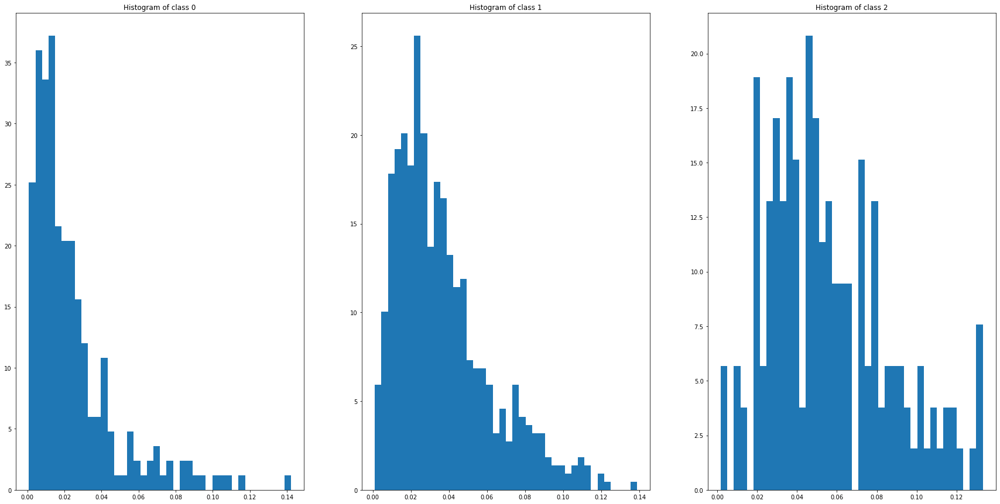

In [228]:
plt.figure(figsize=(30, 15))
plt.subplot(131)
plt.title('Histogram of class 0')
plt.hist(areas_0, bins=40, density = True)
plt.subplot(132)
plt.title('Histogram of class 1')
plt.hist(areas_1, bins=40, density = True)
plt.subplot(133)
plt.title('Histogram of class 2')
plt.hist(areas_2, bins=40, density = True)

(array([ 3.97447622,  6.62412703,  7.94895244,  3.97447622,  7.94895244,
         7.94895244, 13.24825406, 21.1972065 , 13.24825406,  9.27377784,
        11.92342865,  9.27377784,  6.62412703,  6.62412703, 10.59860325,
        10.59860325,  9.27377784,  2.64965081,  3.97447622,  2.64965081,
        11.92342865,  9.27377784,  6.62412703,  2.64965081,  2.64965081,
         2.64965081,  1.32482541,  1.32482541,  0.        ,  0.        ,
         2.64965081,  1.32482541,  2.64965081,  3.97447622,  2.64965081,
         3.97447622,  0.        ,  0.        ,  0.        ,  1.32482541]),
 array([0.        , 0.00441413, 0.00882826, 0.01324239, 0.01765652,
        0.02207066, 0.02648479, 0.03089892, 0.03531305, 0.03972718,
        0.04414131, 0.04855544, 0.05296957, 0.05738371, 0.06179784,
        0.06621197, 0.0706261 , 0.07504023, 0.07945436, 0.08386849,
        0.08828262, 0.09269676, 0.09711089, 0.10152502, 0.10593915,
        0.11035328, 0.11476741, 0.11918154, 0.12359567, 0.12800981,
      

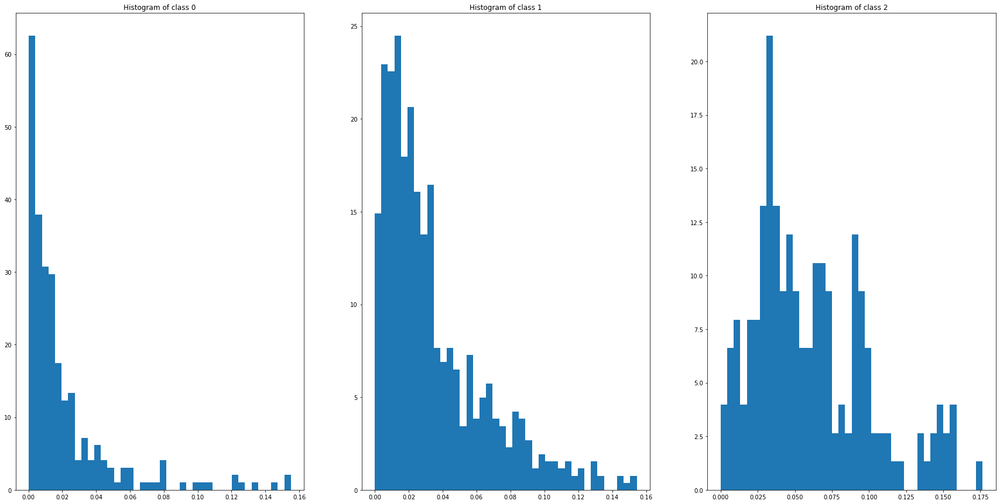

In [223]:
plt.figure(figsize=(30, 15))
plt.subplot(131)
plt.title('Histogram of class 0')
plt.hist(areas_0, bins=40, density = True)
plt.subplot(132)
plt.title('Histogram of class 1')
plt.hist(areas_1, bins=40, density = True)
plt.subplot(133)
plt.title('Histogram of class 2')
plt.hist(areas_2, bins=40, density = True)

In [186]:
from os import listdir
from os.path import isfile, join
path = 'data/0/'

onlyfiles = [f for f in listdir(path) if (isfile(join(path, f)) and 'DS_Store' not in f)]

# im = cv2.imread(file_path_img, cv2.IMREAD_GRAYSCALE)
from collections import defaultdict
low = best_low
high = best_high
hambda = best_hambda
thresh = best_thresh
file_dict_max = defaultdict(lambda : 0)
# counter_dict = defaultdict(int)
for onlyfile in tqdm(onlyfiles):
    filekey = onlyfile.split('_')[1]
    file_dict_max[filekey] = max(file_dict_max[filekey], int(onlyfile.split('_')[2].split('.')[0]))
file_dict_max

100%|██████████| 9821/9821 [00:00<00:00, 710223.62it/s]


defaultdict(<function __main__.<lambda>()>,
            {'0136': 41,
             '0063': 41,
             '0164': 42,
             '0233': 46,
             '0064': 38,
             '0203': 47,
             '0251': 36,
             '0036': 40,
             '0163': 41,
             '0038': 44,
             '0220': 41,
             '0018': 42,
             '0109': 36,
             '0204': 45,
             '0025': 41,
             '0088': 37,
             '0199': 36,
             '0131': 36,
             '0125': 41,
             '0138': 36,
             '0031': 31,
             '0132': 37,
             '0145': 41,
             '0042': 29,
             '0225': 40,
             '0016': 41,
             '0117': 39,
             '0119': 44,
             '0177': 40,
             '0110': 33,
             '0142': 37,
             '0092': 30,
             '0053': 35,
             '0019': 41,
             '0238': 42,
             '0017': 41,
             '0075': 39,
             '0208': 42,
      

In [229]:
min(file_dict_max.values())

29

In [201]:
path = 'data/0/'
def show_masks_overlayed_new(path, j):
    key, value = list(file_dict_max.items())[j]
    print(value)
    for v in range(2, value + 1):
        im = cv2.imread(path + 'study_' + key + '_' + str(v) +'.png', cv2.IMREAD_GRAYSCALE)
        im = np.true_divide(im, 255)

        mask = np.multiply((im > low), (im < high))
        mask = gaussian(mask, sigma=hambda)
        mask = mask > thresh
        plt.figure(figsize=(20, 30))
        plt.subplot(121)
        plt.imshow(im, 'gray', interpolation='none')
        plt.title(np.sum((im > 0).flatten()))
        plt.subplot(122)
        plt.imshow(im, 'gray', interpolation='none')
        plt.imshow(mask, 'jet', interpolation='none', alpha=0.1)
        plt.title(np.sum(mask.flatten()))
        plt.show()

42


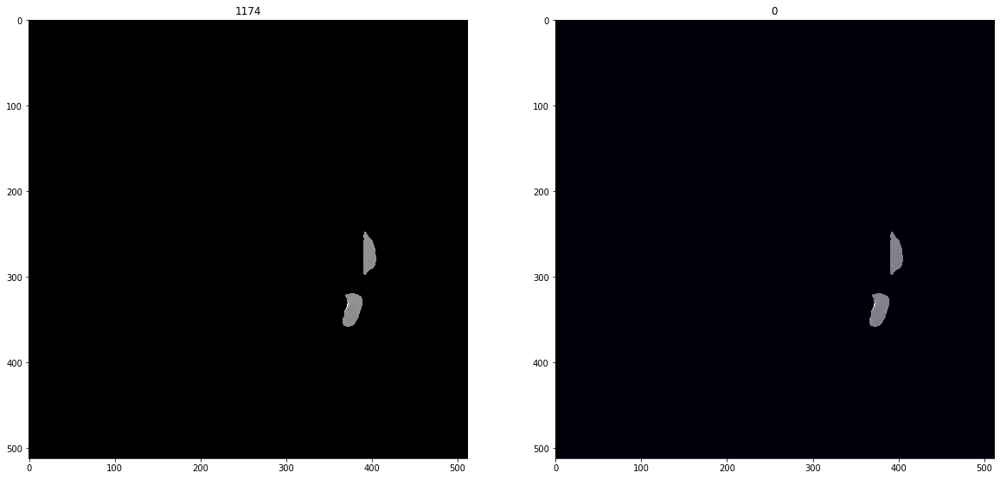

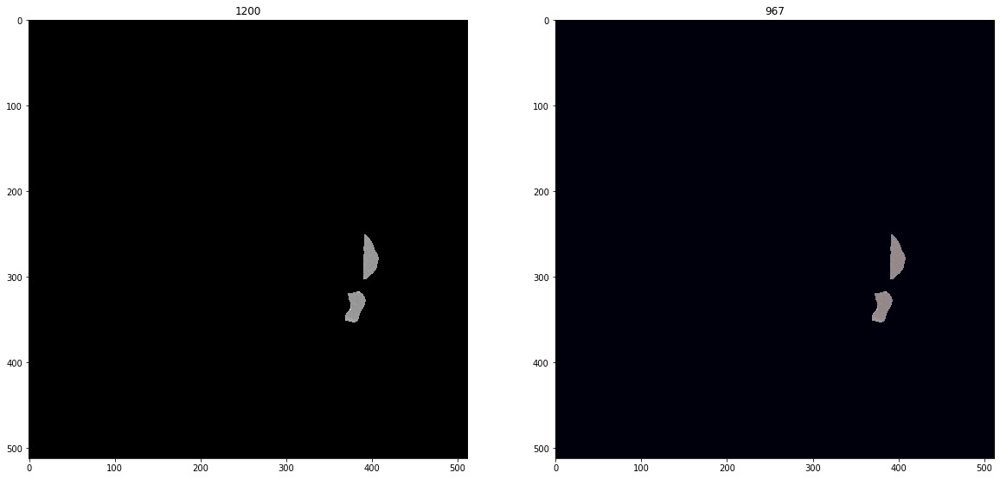

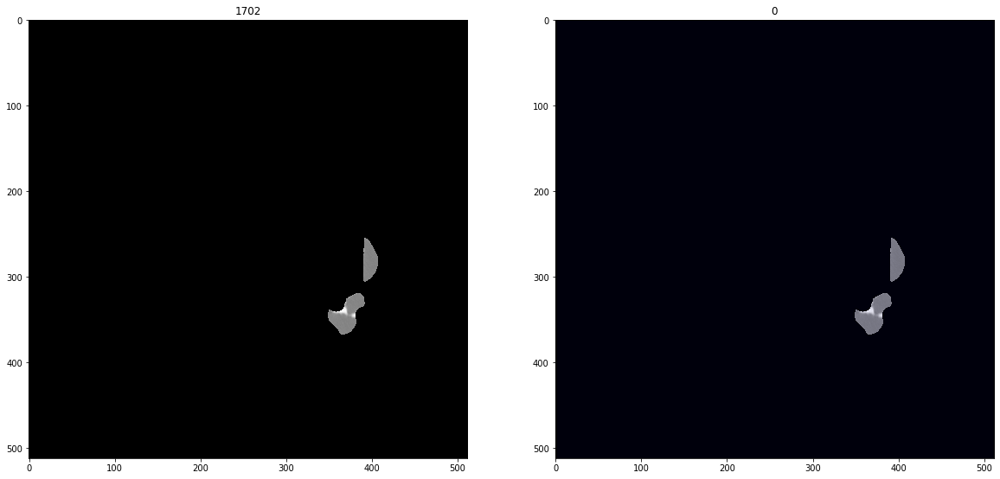

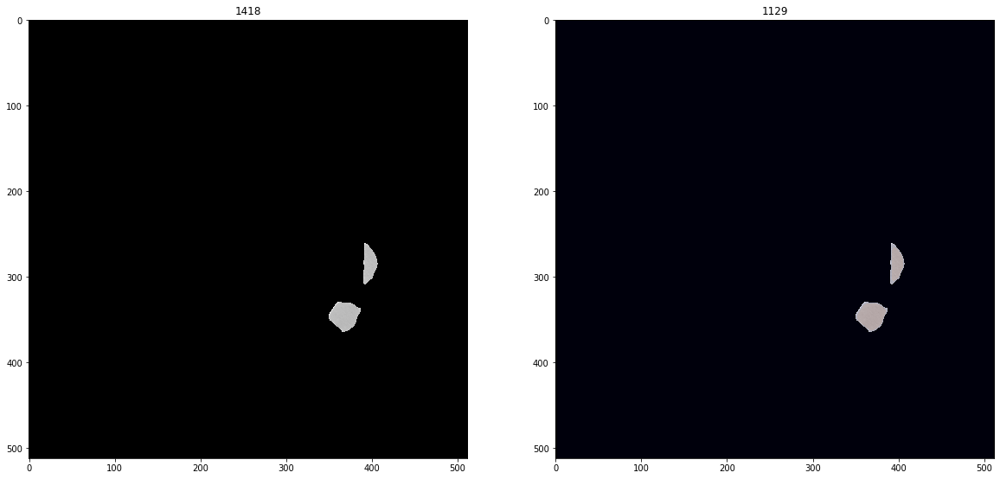

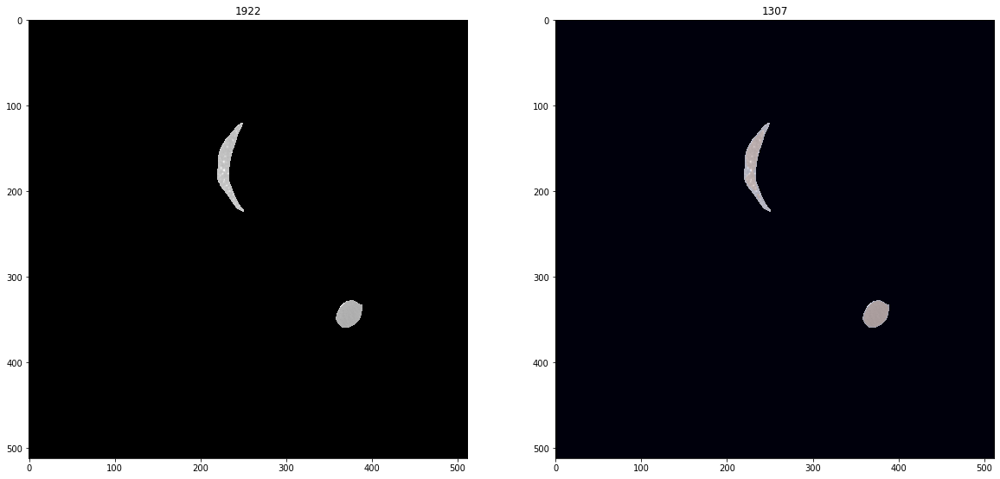

...

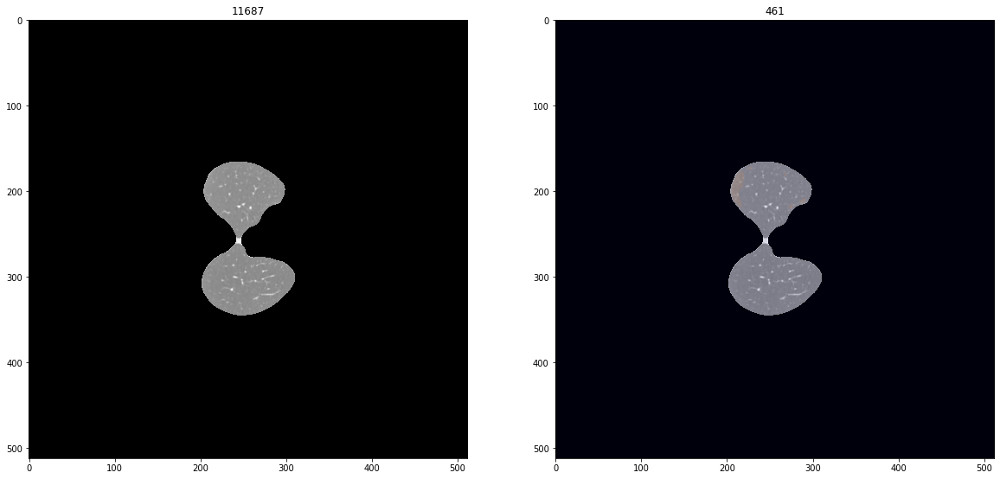

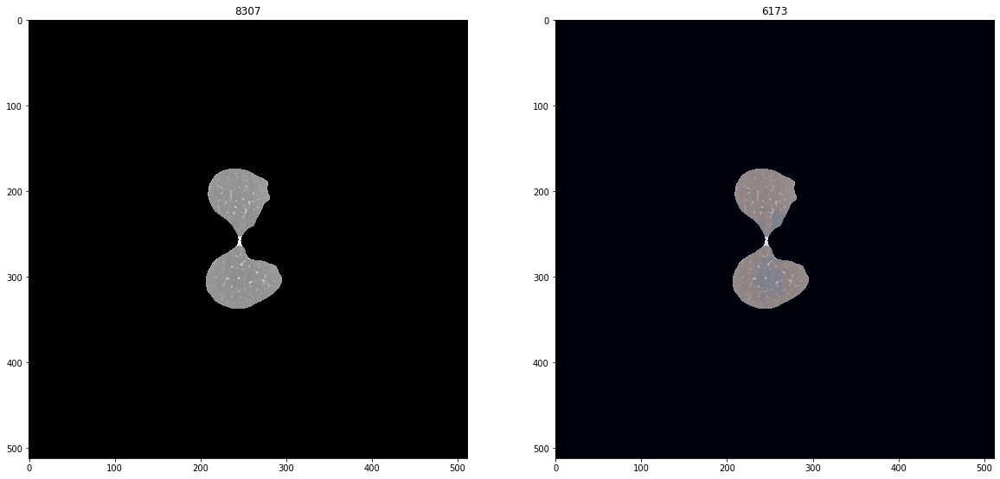

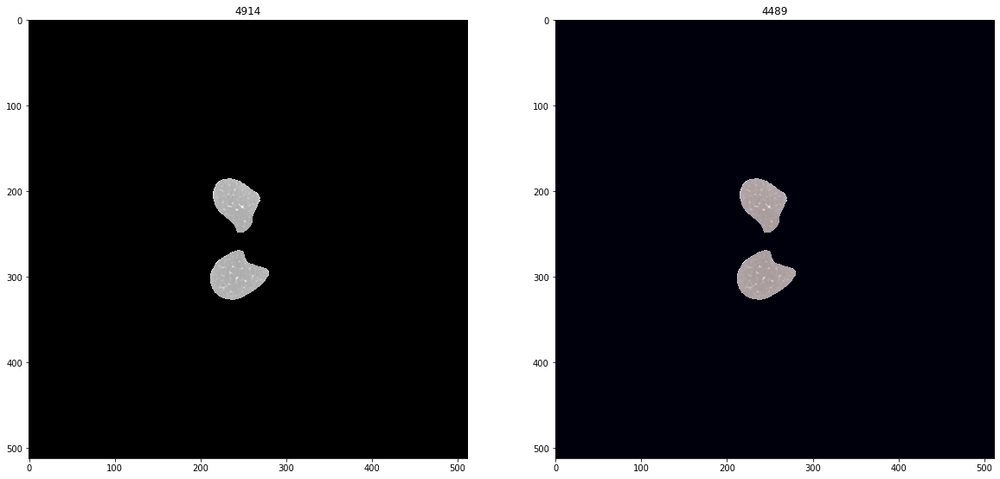

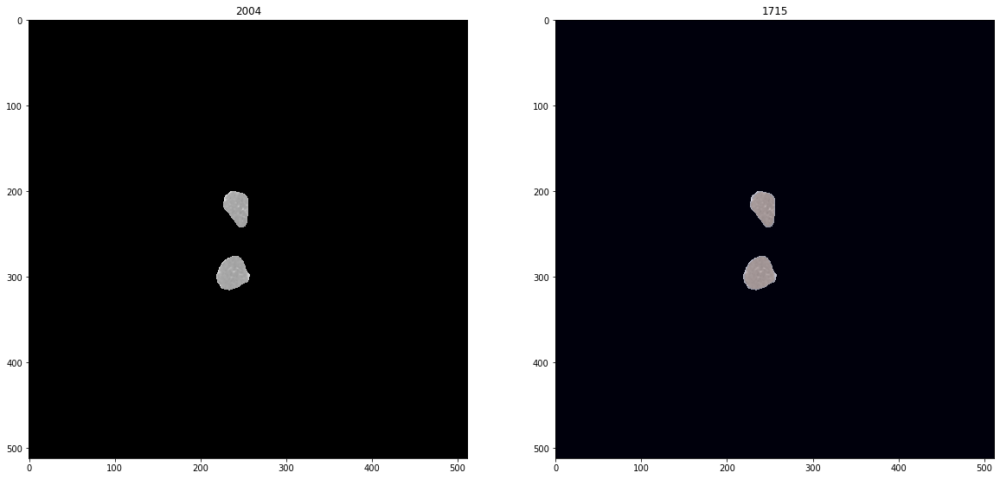

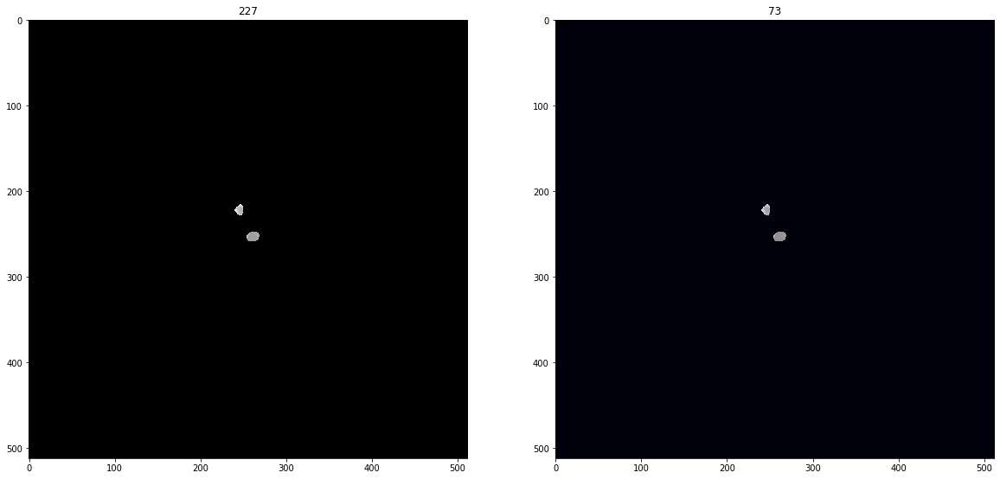

In [202]:
show_masks_overlayed_new(path, 2)

  3%|▎         | 8/254 [00:02<01:18,  3.12it/s]<ipython-input-206-6e0b38c13c3c>:11: RuntimeWarning: invalid value encountered in long_scalars
  ratios.append(np.sum(mask.flatten())/np.sum((im > 0).flatten()))
100%|██████████| 254/254 [01:24<00:00,  3.00it/s]


(array([6215.,  450.,  256.,  158.,  118.,   74.,   68.,   58.,   44.,
          66.,   55.,   38.,   47.,   45.,   35.,   32.,   31.,   42.,
          36.,   24.,   37.,   36.,   29.,   33.,   46.,   44.,   37.,
          34.,   36.,   41.,   31.,   54.,   39.,   45.,   44.,   62.,
          66.,   65.,   74.,   71.,   84.,   71.,  103.,  108.,   93.,
         127.,  133.,  123.,   90.,   49.]),
 array([0.        , 0.01932305, 0.0386461 , 0.05796915, 0.0772922 ,
        0.09661525, 0.1159383 , 0.13526135, 0.1545844 , 0.17390746,
        0.19323051, 0.21255356, 0.23187661, 0.25119966, 0.27052271,
        0.28984576, 0.30916881, 0.32849186, 0.34781491, 0.36713796,
        0.38646101, 0.40578406, 0.42510711, 0.44443016, 0.46375321,
        0.48307626, 0.50239931, 0.52172237, 0.54104542, 0.56036847,
        0.57969152, 0.59901457, 0.61833762, 0.63766067, 0.65698372,
        0.67630677, 0.69562982, 0.71495287, 0.73427592, 0.75359897,
        0.77292202, 0.79224507, 0.81156812, 0.83089117, 

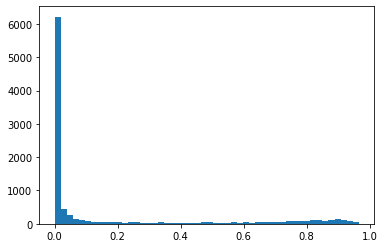

In [206]:
ratios = []
for key in tqdm(file_dict_max.keys()):
    value = file_dict_max[key]
    for v in range(2, value + 1):
        im = cv2.imread(path + 'study_' + key + '_' + str(v) +'.png', cv2.IMREAD_GRAYSCALE)
        im = np.true_divide(im, 255)

        mask = np.multiply((im > low), (im < high))
        mask = gaussian(mask, sigma=hambda)
        mask = mask > thresh
        ratios.append(np.sum(mask.flatten())/np.sum((im > 0).flatten()))
plt.hist(ratios, bins=50)

#### CONTINUE HERE

In [24]:
# from tqdm import tqdm
# from PIL import Image
# from sklearn.model_selection import train_test_split
# max_counter_train = 140
# max_counter_test = 50
# trains = []
# tests = []
# for i in range(3):
#     counter_train = 0
#     counter_test = 0
#     train, test = train_test_split(np.arange(len(file_names[i])), test_size=0.25)
#     trains.append(train)
#     tests.append(test)
#     for j in tqdm(range(len(file_names[i]))):
#         if counter_train > max_counter_train or counter_test > max_counter_test:
#             break
#         prefix = ''
#         if j in train:
#             counter_train+=1
#             prefix = 'train'
#         else:
#             counter_test+=1
#             prefix = 'test'
#         file_path_00 = os.path.join(data_folders[i], file_names[i][j])
#         img_00_raw = img_read(file_path_00)
#         img_00 = my_rescale(img_00_raw)
#         for t in np.arange(2, img_00.shape[2] - 3):
#             I = get_segmented_lungs(postprocess(img_00[:, :, t]))
#             I = get_segmented_lungs(postprocess(img_00[:, :, t]))
#             I8 = (((I - I.min()) / (I.max() - I.min())) * 255.9).astype(np.uint8)
#             img = Image.fromarray(I8)
#             img.save("data/{}/{}/img_{}_{}.png".format(prefix, i, j, t))

 21%|██        | 53/254 [05:01<17:31,  5.23s/it]<ipython-input-24-ad5657bf1462>:30: RuntimeWarning: invalid value encountered in true_divide
  I8 = (((I - I.min()) / (I.max() - I.min())) * 255.9).astype(np.uint8)
100%|██████████| 172/172 [14:58<00:00,  5.22s/it]


In [ ]:
from tqdm import tqdm
from PIL import Image
from sklearn.model_selection import train_test_split
max_counter_train = 140
max_counter_test = 50
trains = []
tests = []
for i in range(3):
    counter_train = 0
    counter_test = 0
    train, test = train_test_split(np.arange(len(file_names[i])), test_size=0.25)
    trains.append(train)
    tests.append(test)
    for j in tqdm(range(len(file_names[i]))):
        if counter_train > max_counter_train or counter_test > max_counter_test:
            break
        prefix = ''
        if j in train:
            counter_train+=1
            prefix = 'train'
        else:
            counter_test+=1
            prefix = 'test'
        file_path_00 = os.path.join(data_folders[i], file_names[i][j])
        img_00_raw = img_read(file_path_00)
        img_00 = my_rescale(img_00_raw)
        for t in np.arange(2, img_00.shape[2] - 3):
#             I = get_segmented_lungs(postprocess(img_00[:, :, t]))
            I = get_segmented_lungs(postprocess(img_00[:, :, t]))
            I8 = (((I - I.min()) / (I.max() - I.min())) * 255.9).astype(np.uint8)
            img = Image.fromarray(I8)
            img.save("data/{}/{}/img_{}_{}.png".format(prefix, i, j, t))

In [ ]:
from tqdm import tqdm
from PIL import Image
from sklearn.model_selection import train_test_split
max_counter_train = 140
max_counter_test = 50
trains = []
tests = []
for i in [3]:
    counter_train = 0
    counter_test = 0
    train, test = train_test_split(np.arange(len(file_names[i])), test_size=0.25)
    trains.append(train)
    tests.append(test)
    for j in tqdm(range(len(file_names[i]))):
        if counter_train > max_counter_train or counter_test > max_counter_test:
            break
        prefix = ''
        if j in train:
            counter_train+=1
            prefix = 'train'
        else:
            counter_test+=1
            prefix = 'test'
        file_path_00 = os.path.join(data_folders[i], file_names[i][j])
        img_00_raw = img_read(file_path_00)
        img_00 = my_rescale(img_00_raw)
        for t in np.arange(2, img_00.shape[2] - 3):
#             I = get_segmented_lungs(postprocess(img_00[:, :, t]))
            I = get_segmented_lungs(postprocess(img_00[:, :, t]))
            I8 = (((I - I.min()) / (I.max() - I.min())) * 255.9).astype(np.uint8)
            img = Image.fromarray(I8)
            img.save("data/{}/{}/img_{}_{}.png".format(prefix, i, j, t))

In [ ]:
# for i in range(img_00.shape[-1]):
#     plt.figure(figsize=(10, 5))
#     plt.subplot(121)
#     plt.imshow(img_00_raw[:, :, i])
#     plt.colorbar()
#     minv, maxv = np.sort(list(set(img_00_raw[:, :, i].flatten())))[[0, -1]]
#     plt.title('Slice #{} (from {} to {})'.format(i + 1, minv, maxv))
#     plt.subplot(122)
#     plt.imshow(img_00[:, :, i])
#     plt.colorbar()
#     plt.title('Slice #{} (from 0.0 to 1.0)'.format(i + 1))
#     plt.show()



# 3. CNN Model

In [26]:
import torch.nn as nn
# from fastai.vision.all import *

import torchvision

from torchvision.datasets import ImageFolder
import torch.nn as nn
from torchvision.models import resnet34
import torchvision.transforms as transforms
import torch.utils.data as Data
import torch
import numpy as np
from torchvision import datasets
from torchvision import transforms
from torch.utils.data.sampler import SubsetRandomSampler

In [27]:
from torch.utils.data import TensorDataset, DataLoader

In [28]:
from torch.utils.data import Dataset, DataLoader

In [29]:
import os
import numpy as np
import nibabel as nib
import gudhi
import matplotlib.pyplot as plt
from persim import plot_diagrams
from ripser import ripser, lower_star_img

In [30]:
from __future__ import print_function, division
import torch.optim as optim
from torch.optim import lr_scheduler
import numpy as np
import torchvision
import time
import copy

In [31]:
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

In [41]:
path = 'data/train/'
train_dataset = ImageFolder(path, transform=data_transforms['train'])
BATCH_SIZE = 32
train_loader = Data.DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True,  num_workers=2)
path = 'data/test/'
test_dataset = ImageFolder(path, transform=data_transforms['val'])
BATCH_SIZE = 32
test_loader = Data.DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=True,  num_workers=2)

In [42]:
device = torch.device("cpu")

In [43]:
class_names = ['CT-1', 'CT-2', 'CT-3/4/5']

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([0, 2, 2, 2, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 2, 2, 1, 1, 0, 1, 2, 1,
        1, 2, 1, 1, 2, 1, 1, 2])


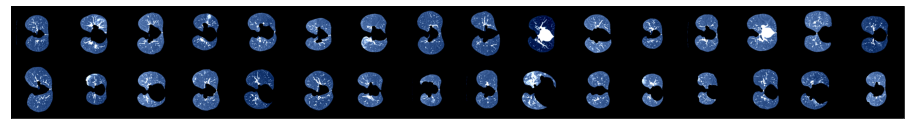

In [44]:
from torchvision.utils import make_grid
import matplotlib.pyplot as plt

def show_batch(dl):
    """Plot images grid of single batch"""
    for images, labels in dl:
        fig,ax = plt.subplots(figsize = (16,12))
        ax.set_xticks([])
        ax.set_yticks([])
        ax.imshow(make_grid(images,nrow=16).permute(1,2,0))
        print(labels)
        break
        
show_batch(train_loader)

In [46]:
import torch.nn as nn
import torch.nn.functional as F

class ImageClassificationBase(nn.Module):
    
    def training_step(self, batch):
        images, labels = batch 
        images = images.to(device)
        labels = labels.to(device)
        out = self(images)                  # Generate predictions
        loss = F.cross_entropy(out, labels) # Calculate loss
        return loss
    
    def validation_step(self, batch):
        images, labels = batch
        images = images.to(device)
        labels = labels.to(device)
        out = self(images)                    # Generate predictions
        loss = F.cross_entropy(out, labels)   # Calculate loss
        acc = accuracy(out, labels)           # Calculate accuracy
        return {'val_loss': loss.detach(), 'val_acc': acc}
        
    def validation_epoch_end(self, outputs):
        batch_losses = [x['val_loss'] for x in outputs]
        epoch_loss = torch.stack(batch_losses).mean()   # Combine losses
        batch_accs = [x['val_acc'] for x in outputs]
        epoch_acc = torch.stack(batch_accs).mean()      # Combine accuracies
        return {'val_loss': epoch_loss.item(), 'val_acc': epoch_acc.item()}
    
    def epoch_end(self, epoch, result):
        print("Epoch [{}], train_loss: {:.4f}, val_loss: {:.4f}, val_acc: {:.4f}".format(
            epoch, result['train_loss'], result['val_loss'], result['val_acc']))

In [47]:
class CTClassification(ImageClassificationBase):
    def __init__(self):
        super().__init__()
        self.prelast = nn.Linear(1600,64)
        self.relu = nn.ReLU()
        self.last = nn.Linear(64,3)
        self.network = nn.Sequential(
            
            nn.Conv2d(3, 16, kernel_size = 8, stride = 1),
            nn.ReLU(),
            nn.Conv2d(16,32, kernel_size = 4, stride = 1),
            nn.ReLU(),
            nn.AvgPool2d(3,3),
            nn.Dropout(0.3),
            nn.Conv2d(32, 64, kernel_size = 4, stride = 2),
            nn.ReLU(),
            nn.MaxPool2d(3,3),
            nn.Dropout(0.3),
            nn.Conv2d(64, 64, kernel_size = 3, stride = 1, padding = 1),
            nn.ReLU(),
            nn.MaxPool2d(2,2),
            nn.Flatten(),
            self.prelast
#             nn.ReLU(),
#             self.last
        )
    
    def forward(self, xb):
        return self.last(self.relu(self.network(xb)))

def accuracy(outputs, labels):
    _, preds = torch.max(outputs, dim=1)
    return torch.tensor(torch.sum(preds == labels).item() / len(preds))

  
@torch.no_grad()
def evaluate(model, val_loader):
    model.eval()
    outputs = [model.validation_step(batch) for batch in val_loader]
    return model.validation_epoch_end(outputs)

  
def fit(epochs, lr, model, train_loader, val_loader, opt_func = torch.optim.SGD):
    
    history = []
    optimizer = opt_func(model.parameters(),lr)
    for epoch in range(epochs):
        
        model.train()
        train_losses = []
        for batch in train_loader:
            loss = model.training_step(batch)
            train_losses.append(loss)
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()
            
        result = evaluate(model, val_loader)
        result['train_loss'] = torch.stack(train_losses).mean().item()
        result['model'] = model.clone()
        model.epoch_end(epoch, result)
        history.append(result)
    
    return history

In [48]:
model = CTClassification()
model = model.to(device)
x = torch.randn(1, 3, 224, 224).to(device)

# Let's print it
model(x).shape, sum(p.numel() for p in model.parameters() if p.requires_grad)

/Users/ahmadsumekenov/Library/Caches/pypoetry/virtualenvs/diploma-GCnEs1M7-py3.8/lib/python3.8/site-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  ../c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


(torch.Size([1, 3]), 183731)

In [50]:
%%time
num_epochs = 10
opt_func = torch.optim.Adam
lr = 3e-4
model = CTClassification()
model = model.to(device)
#fitting the model on training data and record the result after each epoch
history = fit(num_epochs, lr, model, train_loader, test_loader, opt_func)

Epoch [0], train_loss: 1.0951, val_loss: 1.0888, val_acc: 0.4208
Epoch [1], train_loss: 1.0642, val_loss: 1.0431, val_acc: 0.4688
Epoch [2], train_loss: 1.0026, val_loss: 1.0077, val_acc: 0.4972
Epoch [3], train_loss: 0.9650, val_loss: 0.9794, val_acc: 0.5250
Epoch [4], train_loss: 0.8948, val_loss: 0.9569, val_acc: 0.5222
Epoch [5], train_loss: 0.8683, val_loss: 0.9904, val_acc: 0.5382


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fd41ff930d0>
Traceback (most recent call last):
  File "/Users/ahmadsumekenov/Library/Caches/pypoetry/virtualenvs/diploma-GCnEs1M7-py3.8/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1328, in __del__
    self._shutdown_workers()
  File "/Users/ahmadsumekenov/Library/Caches/pypoetry/virtualenvs/diploma-GCnEs1M7-py3.8/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1301, in _shutdown_workers
    w.join(timeout=_utils.MP_STATUS_CHECK_INTERVAL)
  File "/Users/ahmadsumekenov/opt/anaconda3/lib/python3.8/multiprocessing/process.py", line 149, in join
    res = self._popen.wait(timeout)
  File "/Users/ahmadsumekenov/opt/anaconda3/lib/python3.8/multiprocessing/popen_fork.py", line 44, in wait
    if not wait([self.sentinel], timeout):
  File "/Users/ahmadsumekenov/opt/anaconda3/lib/python3.8/multiprocessing/connection.py", line 931, in wait
    ready = selector.select(timeout)
  Fi

KeyboardInterrupt: 

In [56]:
class Identity(nn.Module):
    def __init__(self):
        super(Identity, self).__init__()
        
    def forward(self, x):
        return x

In [57]:
model.last = Identity()
x = torch.randn(1, 3, 224, 224)
x = x.to(device)
output = model(x)
print(output.shape)

torch.Size([1, 64])


In [ ]:
from PIL import Image

im = Image.open('data2/test/0/img_7_15.png').convert('RGB')

im = data_transforms['val'](im)
model(im)

In [ ]:
torch.save(model, 'model.pt')

# 4. Topological features

In [53]:
import os
import numpy as np


import nibabel as nib


import gudhi
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from tqdm import tqdm

import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from persim import plot_diagrams
from ripser import ripser, lower_star_img
from skimage.transform import resize
import numpy as np
from sklearn.model_selection import train_test_split
import numpy as np
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.linear_model import LogisticRegression

In [55]:
trains[0][0], tests[0][0]

(45, 172)

In [70]:
from PIL import Image 
import numpy as np

im1 = Image.open('data/train/0/img_1_18.png').convert('L')
np.array(im1)

(512, 512)

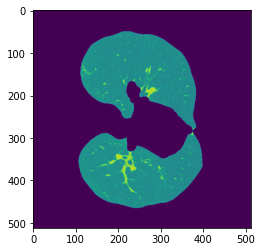

In [75]:
im1 = Image.open('data/train/0/img_1_18.png').convert('L')
im1 = my_rescale(np.array(im1))
plt.imshow(im1)

In [78]:
from os import listdir
from os.path import isfile, join

diagrams_train = []
labels_train = []
diagrams_test = []
labels_test = []

images = []
for i in range(3):
    mypath = 'data/train/{}/'.format(i)
    onlyfiles = [f for f in listdir(mypath) if (isfile(join(mypath, f)) and 'DS_Store' not in f)]
    for fl in tqdm(onlyfiles):
        im = Image.open(mypath + fl).convert('L')
        im = my_rescale(np.array(im))
        diagrams_train.append(lower_star_img(im))
        labels_train.append(i)
    mypath = 'data/test/{}/'.format(i)
    onlyfiles = [f for f in listdir(mypath) if (isfile(join(mypath, f)) and 'DS_Store' not in f)]
    for fl in tqdm(onlyfiles):
        im = Image.open(mypath + fl).convert('L')
        im = my_rescale(np.array(im))
        diagrams_test.append(lower_star_img(im))
        labels_test.append(i)

100%|██████████| 430/430 [03:59<00:00,  1.79it/s]


## 4.2 Gudhi representations

In [81]:
%%time
import gudhi.representations as tda
from sklearn.pipeline import Pipeline
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier as RF
from sklearn.neighbors import KNeighborsClassifier as kNN
from sklearn.model_selection import GridSearchCV
from imblearn.pipeline import make_pipeline
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from tqdm import tqdm

CPU times: user 29 µs, sys: 1e+03 ns, total: 30 µs
Wall time: 52.9 µs


In [82]:
for i in range(len(diagrams_train)):
    array = diagrams_train[i]
    whereinf = np.isfinite(array)
    array[~whereinf] = 1
    array = np.nan_to_num(array)
    diagrams_train[i] = array

for i in range(len(diagrams_test)):
    array = diagrams_test[i]
    whereinf = np.isfinite(array)
    array[~whereinf] = 1
    array = np.nan_to_num(array)
    diagrams_test[i] = array

In [85]:
import gudhi.representations as tda
from imblearn.pipeline import Pipeline, make_pipeline
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier as RF
from sklearn.neighbors import KNeighborsClassifier as kNN
from sklearn.model_selection import GridSearchCV
from imblearn.over_sampling import RandomOverSampler
pipe = Pipeline([("TDA",       tda.PersistenceImage()),
                 ("Estimator", SVC())])

param =    [{"TDA": [tda.BettiCurve()], 
             "TDA__resolution": [100, 200],
             "Estimator": [RF(), LogisticRegression()]},
            
            {"TDA": [tda.PersistenceImage()], 
             "TDA__resolution": [ [10,10], [15,15] ],
             "TDA__bandwidth": [0.1, 1.0, 10.0],
             "Estimator": [RF(), LogisticRegression()]},
            
            {"TDA": [tda.Landscape()], 
             "TDA__resolution": [100, 200],
             "Estimator": [RF(), LogisticRegression()]}
           ]
model = GridSearchCV(pipe, param, cv=3)
# model = model.fit(diagrams, labels)

In [86]:
from sklearn.model_selection import ParameterGrid
grid = ParameterGrid(model.param_grid)

In [90]:
time.time()

1624146790.368829

PIPE NUMBER  0
TEST SCORE 0.48936170212765956
TRAIN SCORE 1.0
OVERFIT SCORE 2.0434782608695654
TIME PASSED 30.94299006462097 sec


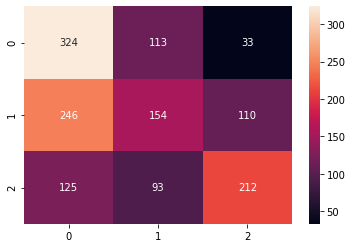

PIPE NUMBER  1
TEST SCORE 0.4900709219858156
TRAIN SCORE 1.0
OVERFIT SCORE 2.040520984081042
TIME PASSED 31.74292302131653 sec


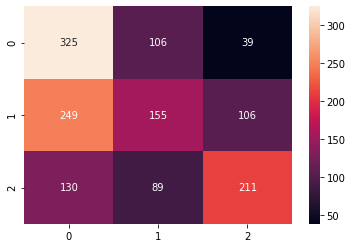

/Users/ahmadsumekenov/Library/Caches/pypoetry/virtualenvs/diploma-GCnEs1M7-py3.8/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


PIPE NUMBER  2
TEST SCORE 0.44680851063829785
TRAIN SCORE 0.4759803921568627
OVERFIT SCORE 1.0652894491129785
TIME PASSED 28.384974002838135 sec


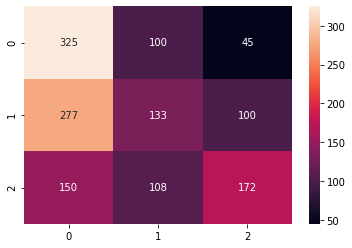

/Users/ahmadsumekenov/Library/Caches/pypoetry/virtualenvs/diploma-GCnEs1M7-py3.8/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


PIPE NUMBER  3
TEST SCORE 0.4368794326241135
TRAIN SCORE 0.4803921568627451
OVERFIT SCORE 1.0995989304812834
TIME PASSED 31.486667156219482 sec


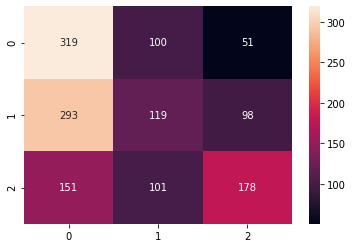

PIPE NUMBER  4
TEST SCORE 0.43617021276595747
TRAIN SCORE 1.0
OVERFIT SCORE 2.292682926829268
TIME PASSED 29.534790754318237 sec


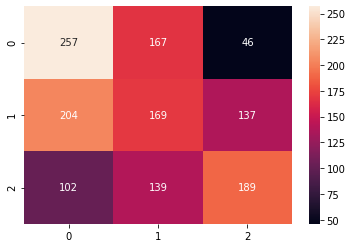

PIPE NUMBER  5
TEST SCORE 0.4390070921985816
TRAIN SCORE 1.0
OVERFIT SCORE 2.2778675282714054
TIME PASSED 67.75852489471436 sec


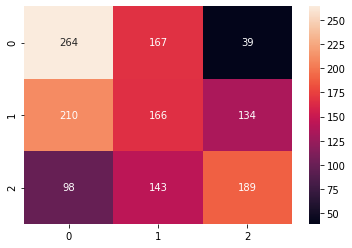

PIPE NUMBER  6
TEST SCORE 0.3773049645390071
TRAIN SCORE 1.0
OVERFIT SCORE 2.6503759398496243
TIME PASSED 30.614104986190796 sec


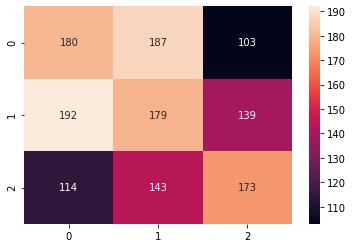

PIPE NUMBER  7
TEST SCORE 0.37446808510638296
TRAIN SCORE 1.0
OVERFIT SCORE 2.6704545454545454
TIME PASSED 72.68667006492615 sec


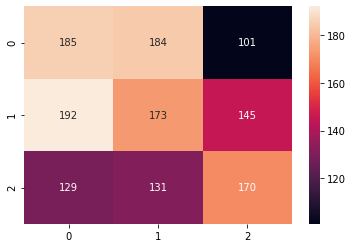

PIPE NUMBER  8
TEST SCORE 0.3595744680851064
TRAIN SCORE 1.0
OVERFIT SCORE 2.7810650887573964
TIME PASSED 30.191872119903564 sec


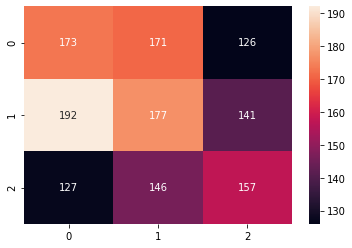

PIPE NUMBER  9
TEST SCORE 0.34822695035460993
TRAIN SCORE 1.0
OVERFIT SCORE 2.8716904276985744
TIME PASSED 69.45042395591736 sec


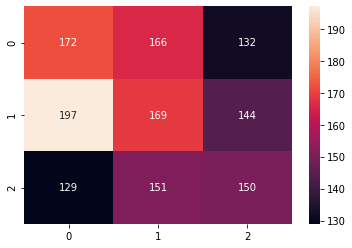

/Users/ahmadsumekenov/Library/Caches/pypoetry/virtualenvs/diploma-GCnEs1M7-py3.8/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


PIPE NUMBER  10
TEST SCORE 0.4624113475177305
TRAIN SCORE 0.46740196078431373
OVERFIT SCORE 1.0107925839047276
TIME PASSED 34.711673974990845 sec


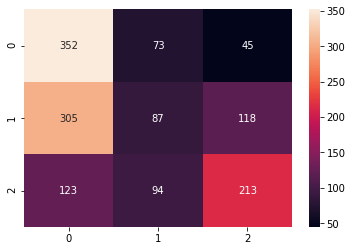

/Users/ahmadsumekenov/Library/Caches/pypoetry/virtualenvs/diploma-GCnEs1M7-py3.8/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


PIPE NUMBER  11
TEST SCORE 0.4390070921985816
TRAIN SCORE 0.45759803921568626
OVERFIT SCORE 1.0423477145300768
TIME PASSED 72.50801301002502 sec


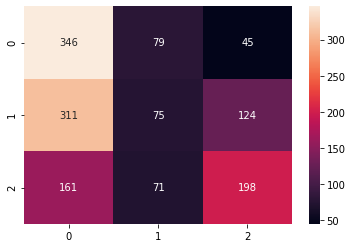

PIPE NUMBER  12
TEST SCORE 0.43829787234042555
TRAIN SCORE 0.4424019607843137
OVERFIT SCORE 1.0093636969350845
TIME PASSED 29.662155151367188 sec


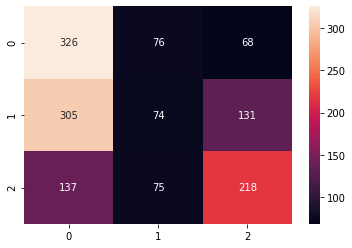

PIPE NUMBER  13
TEST SCORE 0.43617021276595747
TRAIN SCORE 0.44191176470588234
OVERFIT SCORE 1.0131635581061693
TIME PASSED 69.18617296218872 sec


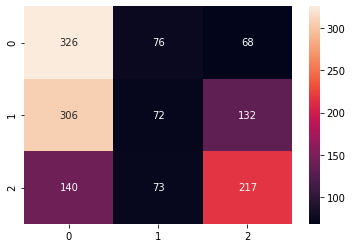

PIPE NUMBER  14
TEST SCORE 0.4
TRAIN SCORE 0.36004901960784313
OVERFIT SCORE 0.9001225490196078
TIME PASSED 28.703793048858643 sec


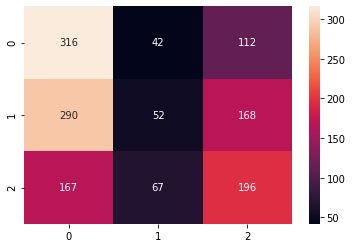

PIPE NUMBER  15
TEST SCORE 0.4
TRAIN SCORE 0.3602941176470588
OVERFIT SCORE 0.900735294117647
TIME PASSED 69.15709209442139 sec


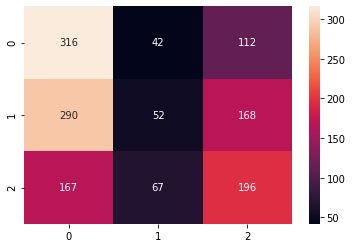

PIPE NUMBER  16
TEST SCORE 0.4836879432624113
TRAIN SCORE 1.0
OVERFIT SCORE 2.067448680351906
TIME PASSED 870.7341439723969 sec


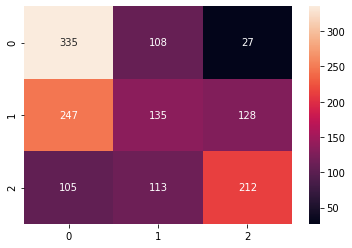

PIPE NUMBER  17
TEST SCORE 0.4929078014184397
TRAIN SCORE 1.0
OVERFIT SCORE 2.028776978417266
TIME PASSED 885.1895139217377 sec


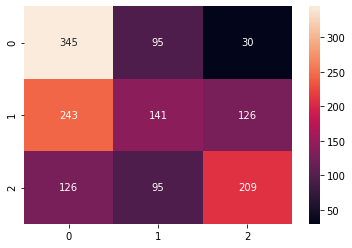

/Users/ahmadsumekenov/Library/Caches/pypoetry/virtualenvs/diploma-GCnEs1M7-py3.8/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


PIPE NUMBER  18
TEST SCORE 0.4085106382978723
TRAIN SCORE 0.4308823529411765
OVERFIT SCORE 1.054764093137255
TIME PASSED 901.6914281845093 sec


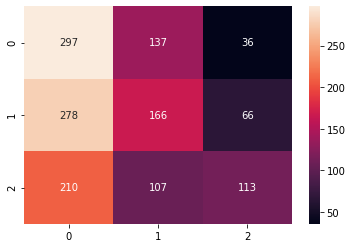

KeyboardInterrupt: 

In [91]:
%matplotlib inline
pipes = []
counter = 0
import seaborn as sns
from sklearn.metrics import confusion_matrix
for g in grid:
    t_0 = time.time()
    tdd = g['TDA']
    g['TDA'] = tdd
    estimator = g['Estimator']
    g['Estimator'] = estimator
    for k in g.keys():
        if '__' in k:
            setattr(g[k.split('__')[0]], k.split('__')[1], g[k])
    pipe = Pipeline([("TDA", g['TDA']), ("Estimator", g['Estimator'])])
    pipe.fit(diagrams_train, labels_train)
    print('PIPE NUMBER ', counter)
    counter += 1
    test_score = pipe.score(diagrams_test, labels_test)
    train_score = pipe.score(diagrams_train, labels_train)
    print("TEST SCORE", test_score)
    print("TRAIN SCORE", train_score)
    print("OVERFIT SCORE", train_score/test_score)
    print("TIME PASSED", time.time() - t_0, "sec")
    cm = confusion_matrix(labels_test, pipe.predict(diagrams_test))
    sns.heatmap(cm, annot=True,fmt='g')
    plt.show()
    pipes.append(pipe)

### Top-10 features

# 5. Concatenate CNN features with topological features

In [ ]:
# from PIL import Image

# im = Image.open('data2/test/0/img_7_15.png').convert('RGB')

# im = data_transforms['val'](im)
# model(im)

In [ ]:
from os import listdir
from os.path import isfile, join

diagrams_train = []
labels_train = []
diagrams_test = []
labels_test = []

images = []
for i in range(3):
    mypath = 'data/train/{}/'.format(i)
    onlyfiles = [f for f in listdir(mypath) if (isfile(join(mypath, f)) and 'DS_Store' not in f)]
    for fl in tqdm(onlyfiles):
        im = Image.open(mypath + fl).convert('L')
        im = data_transforms['val'](im)
        diagrams_train.append(lower_star_img(im))
        labels_train.append(i)
    mypath = 'data/test/{}/'.format(i)
    onlyfiles = [f for f in listdir(mypath) if (isfile(join(mypath, f)) and 'DS_Store' not in f)]
    for fl in tqdm(onlyfiles):
        im = Image.open(mypath + fl).convert('L')
        im = my_rescale(np.array(im))
        diagrams_test.append(lower_star_img(im))
        labels_test.append(i)